In [40]:
import rasterio as rio
import os
import numpy as np
import matplotlib.pyplot as plt
import shutil
from scipy.interpolate import interp2d
import pandas as pd
import glob
import subprocess

# function that writes a new raster
def rio_write(out_path, nparray, crs, ref_raster_bounds, grid_spacing):
    # Function to write a numpy array to a Geotiff using rasterio
    # The geotiff will have the same bounds and crs as the reference raster
    # An evenly-spaced grid will be created with the grid spacing entered
    #
    # INPUTS:
    #   out_path: the path with name of the output gtiff file
    #   nparray: the nparray to write to gtiff
    #   ref_raster: the reference raster (we borrow its crs and bounding coordinates)
    #   grid_spacing: the spatial resolution of the output raster
    
    import rasterio as rio
    import numpy as np
    nparray = np.array(nparray) # make sure it's an np array
    
    with rio.open(out_path,'w',
                      driver='GTiff',
                      height=nparray.shape[0], # new shape
                      width=nparray.shape[1], # new shape
                      dtype=nparray.dtype, # data type
                      count=1,
                      crs=crs, # the EPSG from the original DEM
                      transform=rio.Affine(grid_spacing, 0.0, ref_raster_bounds.left, # modified transform
                                           0.0, -grid_spacing, ref_raster_bounds.top)) as dst:
            dst.write(nparray, 1)


In [70]:
# LSpath = '/Volumes/JUKES_EXT/CautoRIFT_sites/LS_LO/' # input LS images
# # LSpath = '/Users/jukesliu/Documents/TURNER/DATA/IMAGERY/LSimages/useable_images/' # input LS images
# # s2path = '/Volumes/JUKES_EXT/CautoRIFT_sites/S2_SK/SK_clipped/' # input S2 images
# s2path = '/Volumes/JUKES_EXT/CautoRIFT_sites/S2_LO/' # input S2 images

LSpath = '/Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/'# input LS images
s2path = '/Volumes/JUKES_EXT/CautoRIFT_sites/VG/sentinel2_VG/' # input S2 images

In [71]:
# list of paths to folders that contain imagery (must all be cropped to the same AOI)
folderpath_list = [LSpath, s2path]

In [72]:
# grab minimum image resolution from all folders
resolutions = []
bounds = []
crs_list = []
for folder in folderpath_list:
    # all images in each folder have the same resolution:
    files = glob.glob(folder+'*.tif')
    files.extend(glob.glob(folder+'*.TIF'))
    file = files[0] # just grab the first file
    print(file)

    img_r = rio.open(file) # open the file
    img = img_r.read(1)
    print(img.shape)
    print(img_r.crs)
    img_res = img_r.transform[0] # grab the resolution
    img_bounds = img_r.bounds
    resolutions.append(img_res) # add to list
    bounds.append(img_bounds)
    crs_list.append(img_r.crs)

    # if they are different, must loop through all of them instead of just grabbing the first

idx_min = np.argmin(resolutions)
MIN_RES = resolutions[idx_min]
MIN_BOUNDS = bounds[idx_min]
MIN_CRS = crs_list[idx_min]
print()
print('Reference image chosen:')
print(MIN_RES)
print(MIN_BOUNDS)
print(MIN_CRS)

# grab the resampled x and y grid values from the finest resolution image
new_x = np.arange(MIN_BOUNDS.left, MIN_BOUNDS.right, MIN_RES)
new_y = np.arange(MIN_BOUNDS.top, MIN_BOUNDS.bottom, -MIN_RES)

/Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20130610_20200912_02_T1_B8_BufferVariegated_clipped.tif
(450, 1173)
EPSG:32607
/Volumes/JUKES_EXT/CautoRIFT_sites/VG/sentinel2_VG/S2B_7VEG_20171104_B08_VG_clipped.tif
(676, 1760)
EPSG:32607

Reference image chosen:
10.0
BoundingBox(left=591230.0, bottom=6649830.0, right=608830.0, top=6656590.0)
EPSG:32607


In [73]:
# make sure all images are repojrected to the correct crs
for folder in folderpath_list:
    # all images in each folder have the same resolution:
    files = glob.glob(folder+'*.tif')
    files.extend(glob.glob(folder+'*.TIF'))
    for file in files:
        img_r = rio.open(file) # open the file
        if img_r.crs != MIN_CRS:
            print('reproject', file)

            rp_cmd = "gdalwarp -t_srs "+str(MIN_CRS)+' -s_srs '+str(img_r.crs)+' '+file+" "+file[:-4]+'_rp.TIF'
            print(rp_cmd)
            subprocess.run(rp_cmd, shell=True,check=True)   

In [68]:
# remove those with incorrect CRS now
for folder in folderpath_list:
    # all images in each folder have the same resolution:
    files = glob.glob(folder+'*.tif')
    files.extend(glob.glob(folder+'*.TIF'))
    for file in files:
        img_r = rio.open(file) # open the file
        if img_r.crs != MIN_CRS:
            os.remove(file)

(450, 1173)
Resampled to new dimensions: (676, 1760)


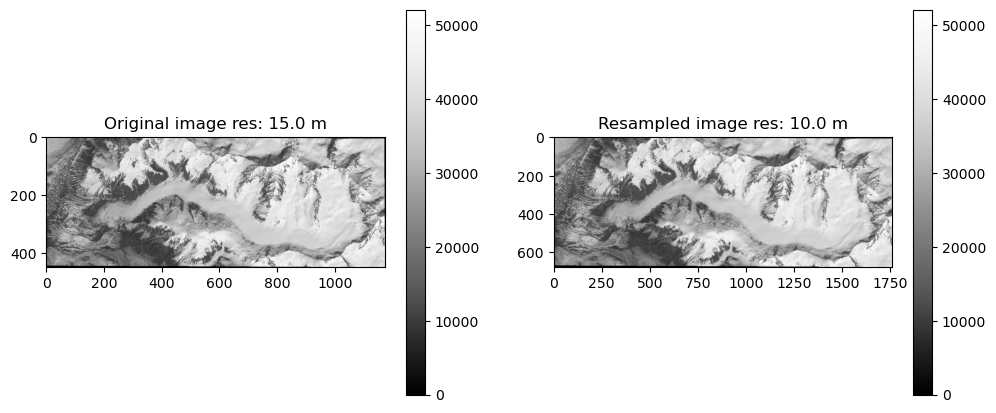

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20130610_20200912_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


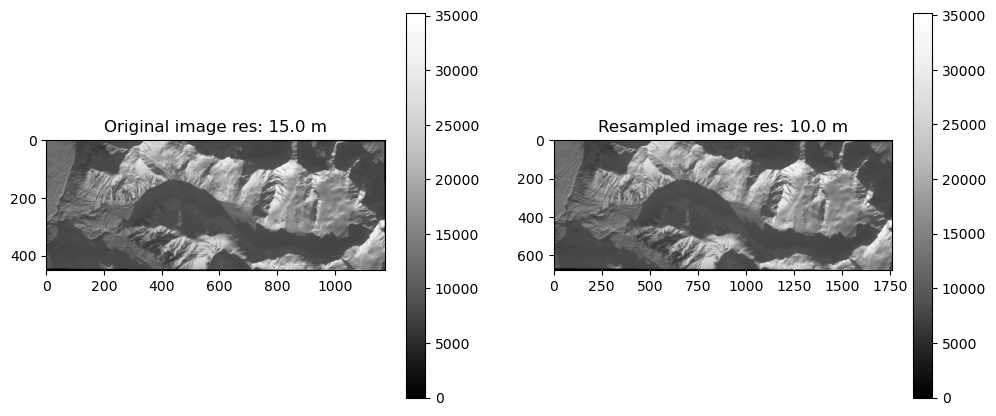

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20140205_20200912_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


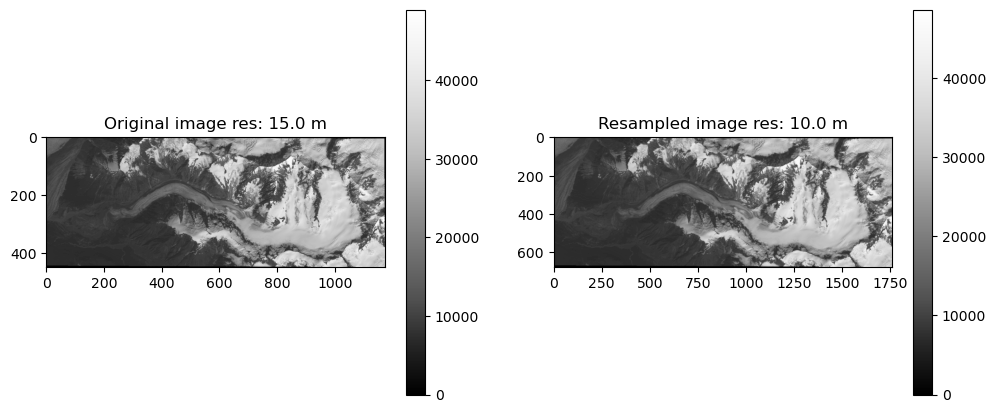

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20140731_20200911_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


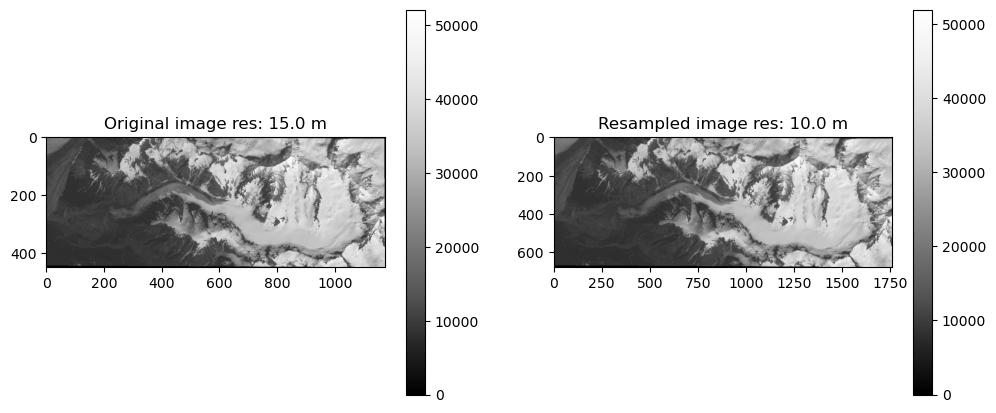

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20130712_20200912_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


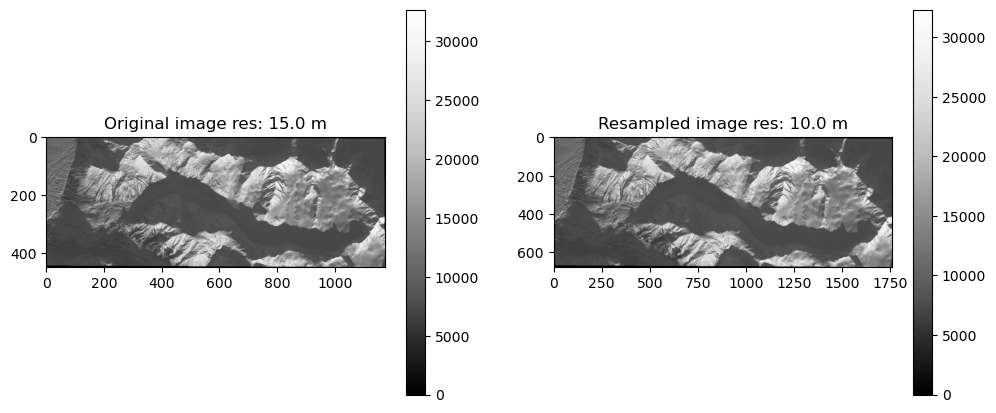

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_061018_20221118_20230321_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


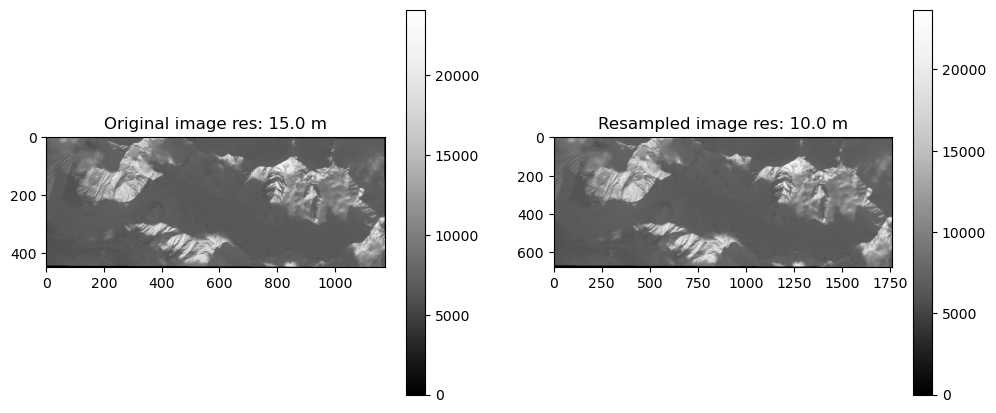

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20161211_20200905_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


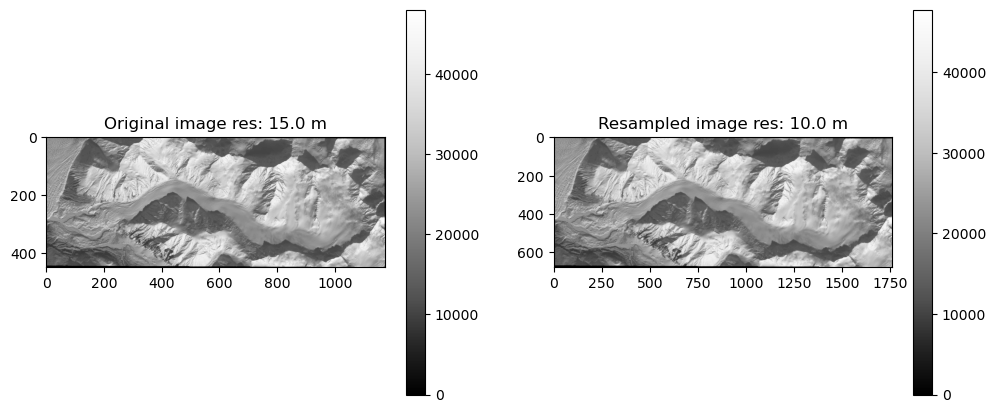

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20150319_20200909_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


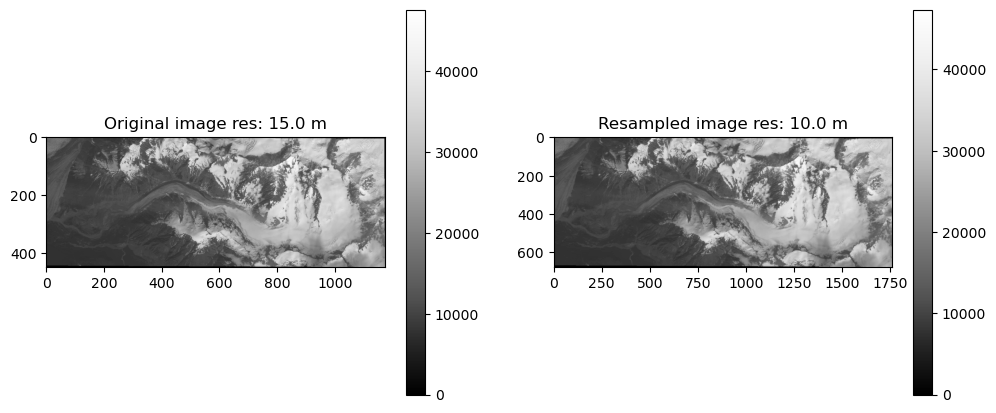

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20200731_20200908_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


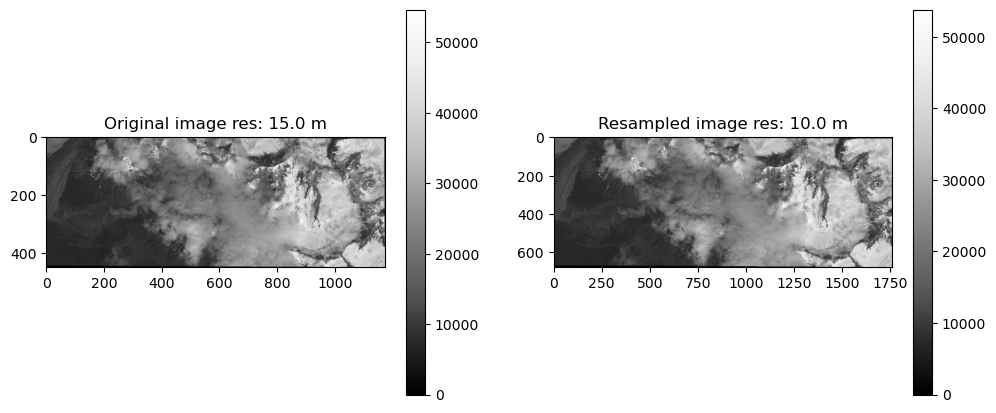

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20150709_20200909_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


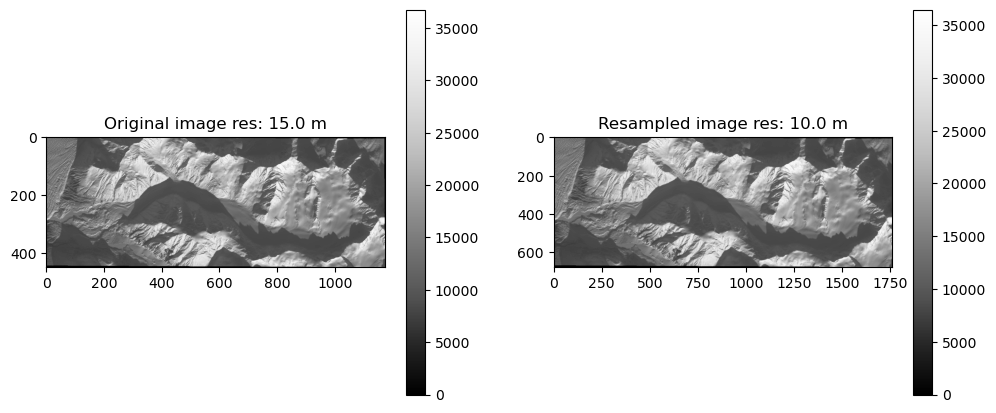

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20190210_20200829_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


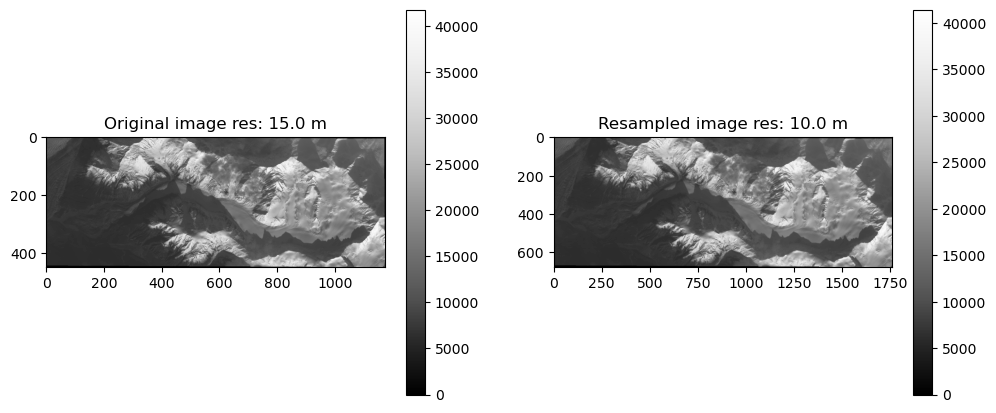

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_062018_20221024_20230324_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


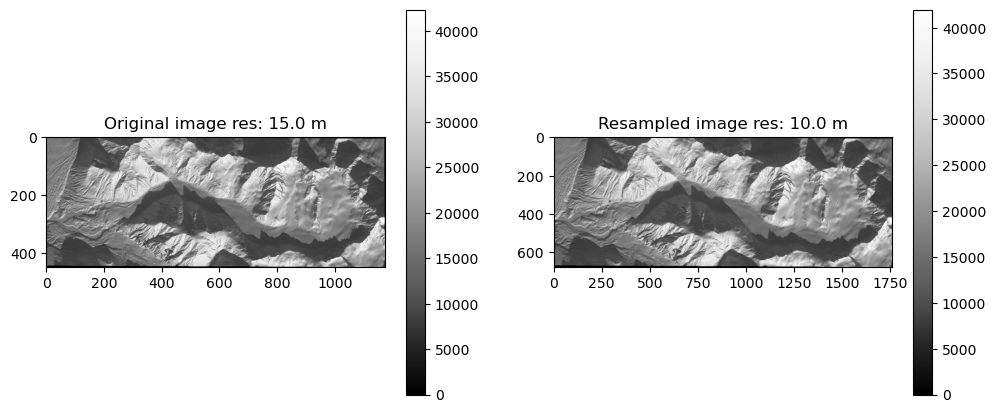

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20170220_20200905_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


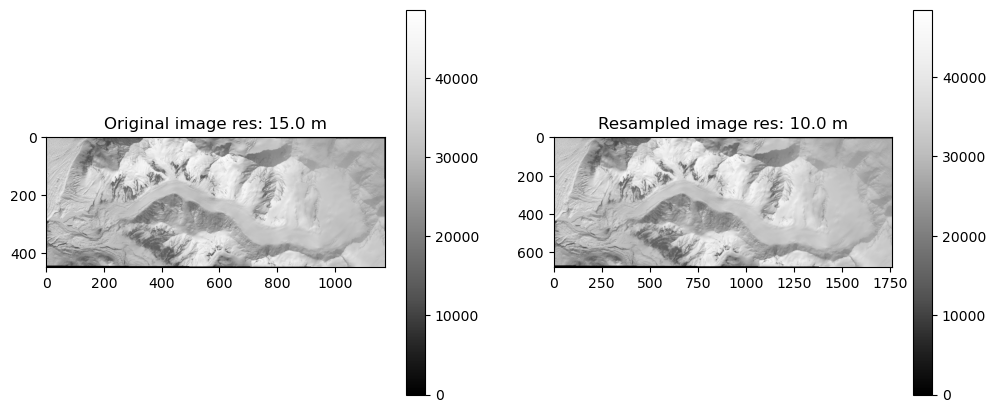

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20200417_20200822_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


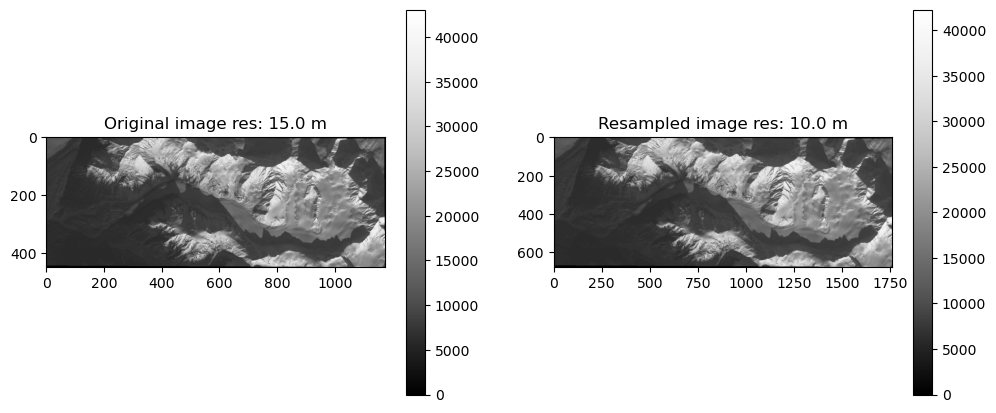

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20221025_20221107_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


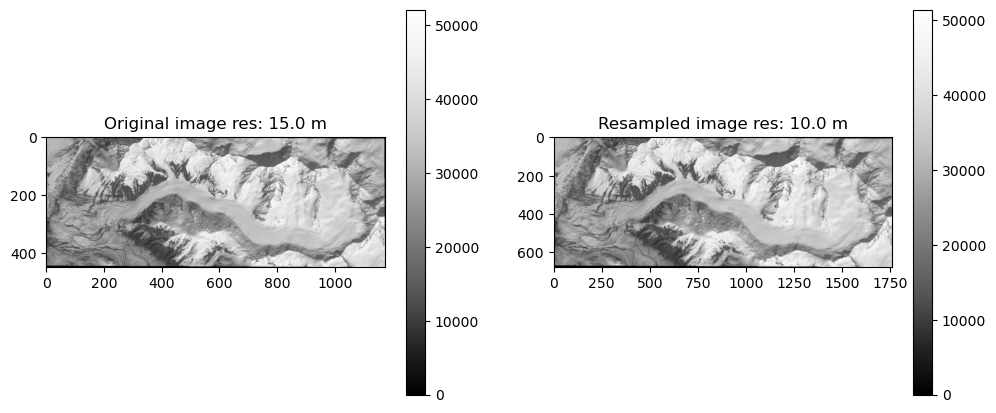

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20190501_20200829_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


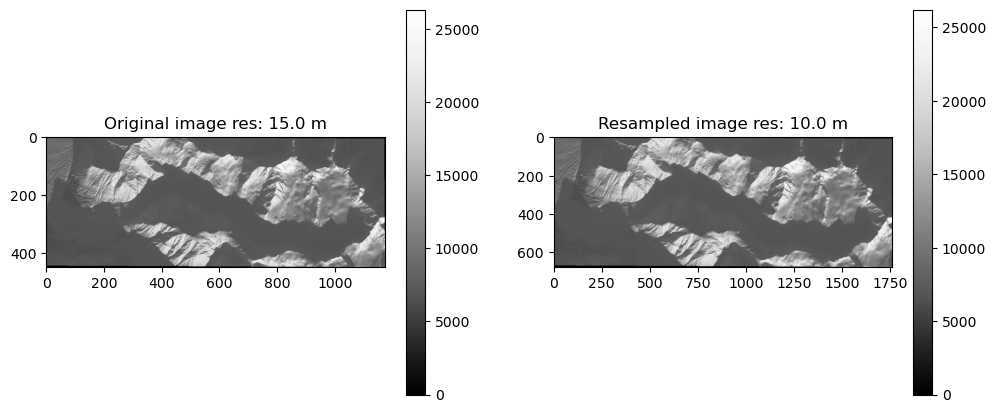

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20190109_20200830_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


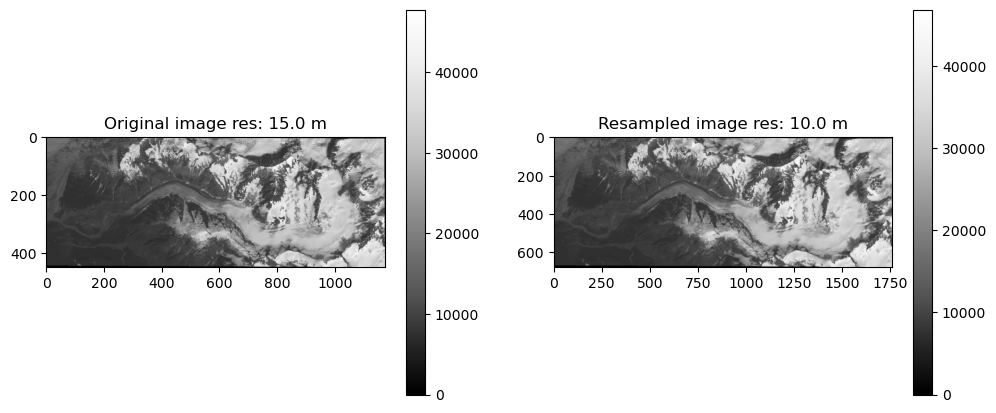

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_061018_20220729_20230405_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


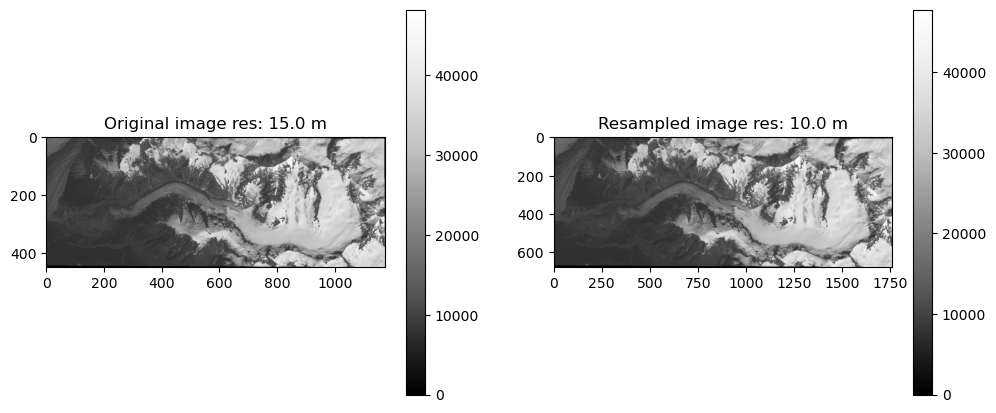

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20140722_20200911_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


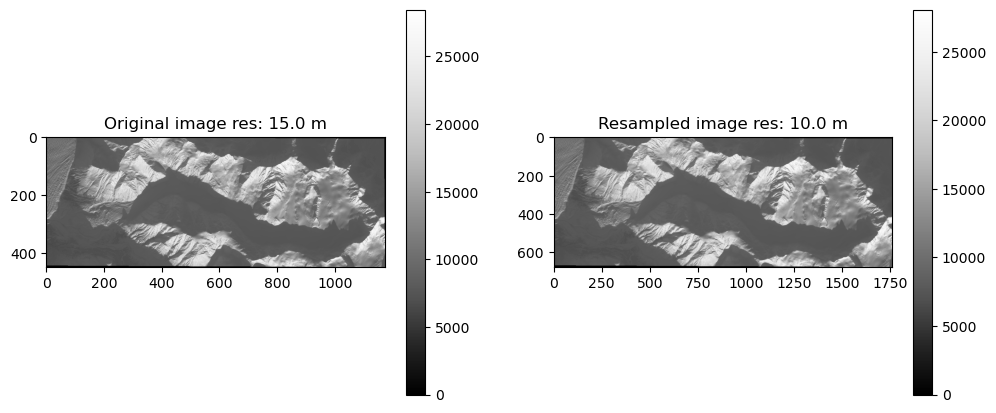

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20151123_20200908_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


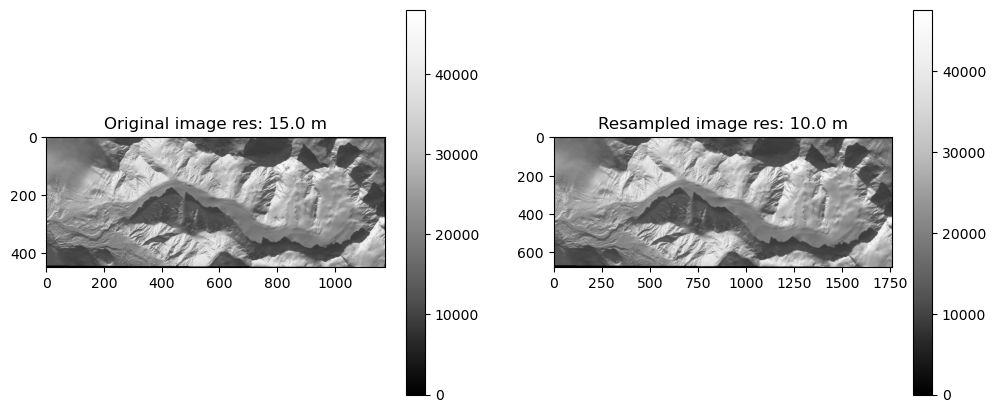

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20220306_20220314_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


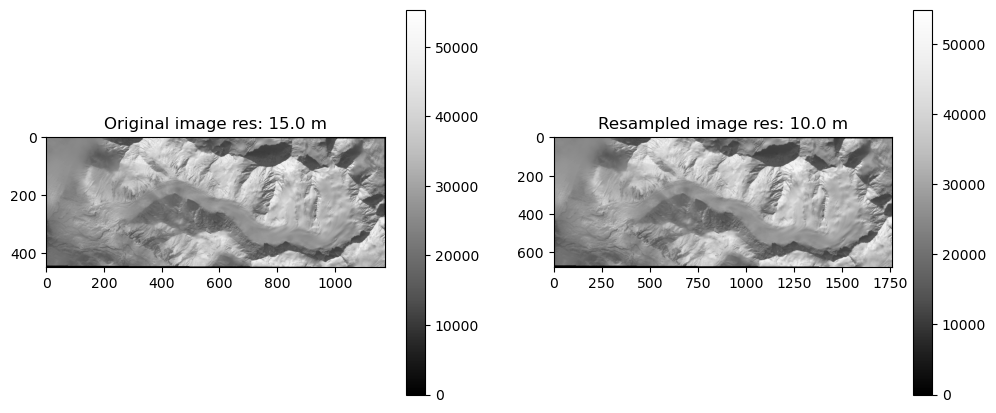

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20160330_20200907_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


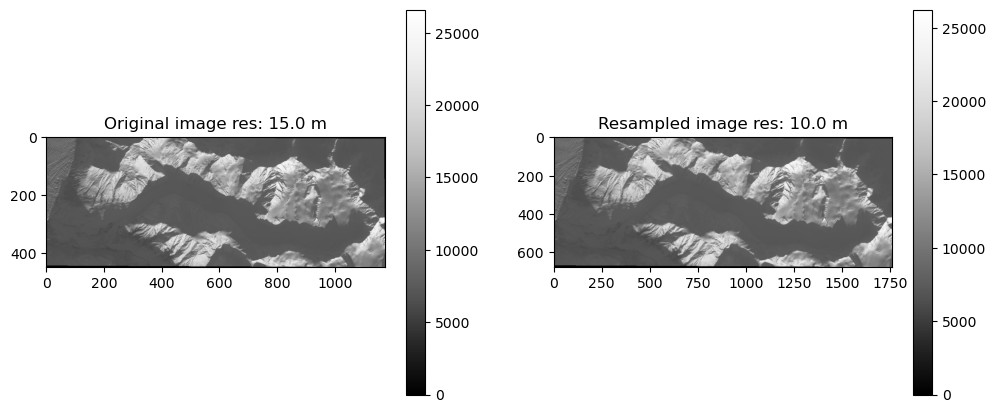

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20221203_20221212_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


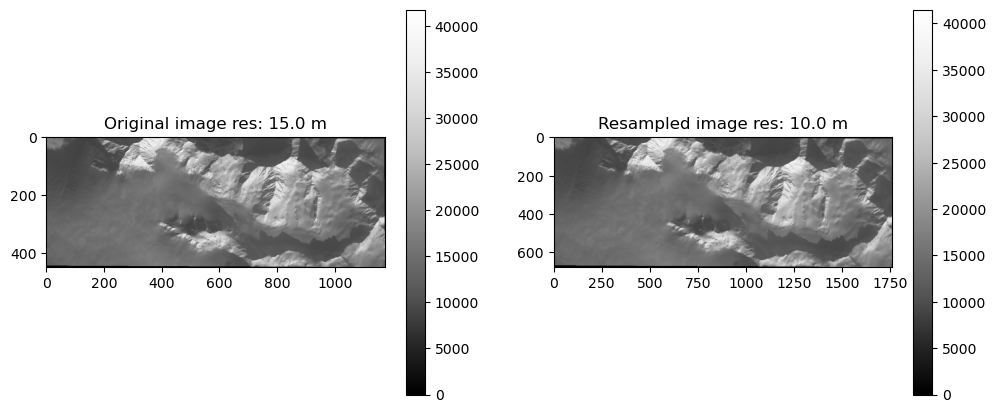

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_061018_20220219_20230427_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


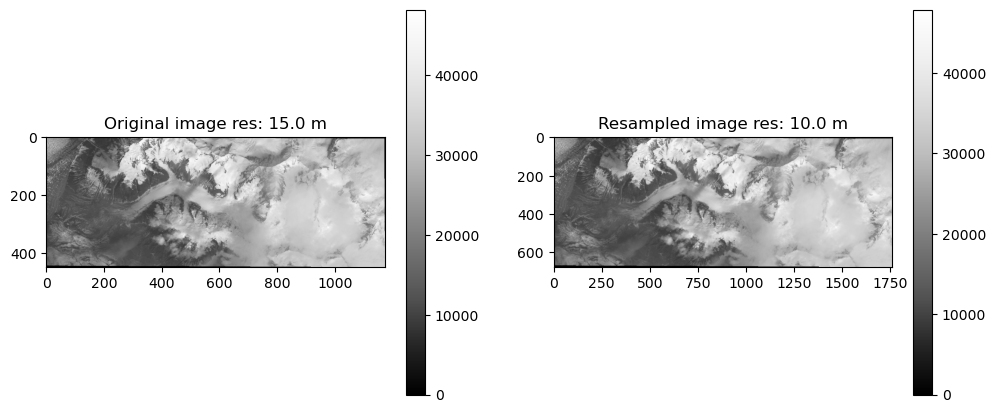

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_061018_20220611_20230413_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


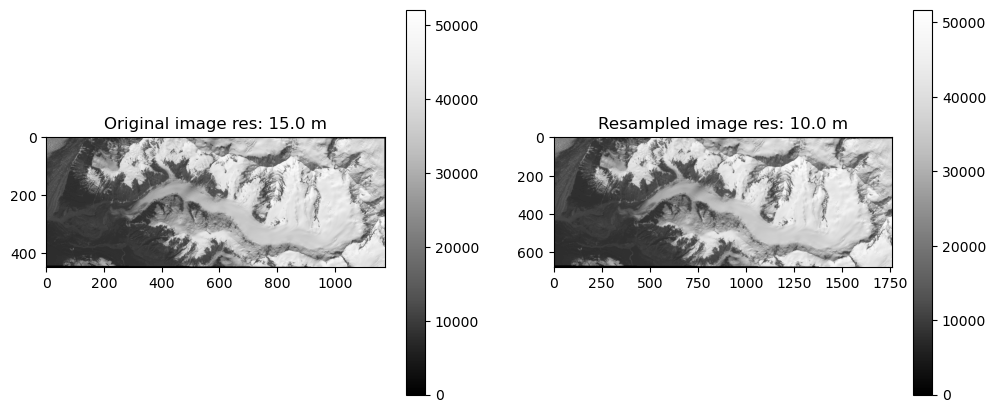

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20160609_20200906_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


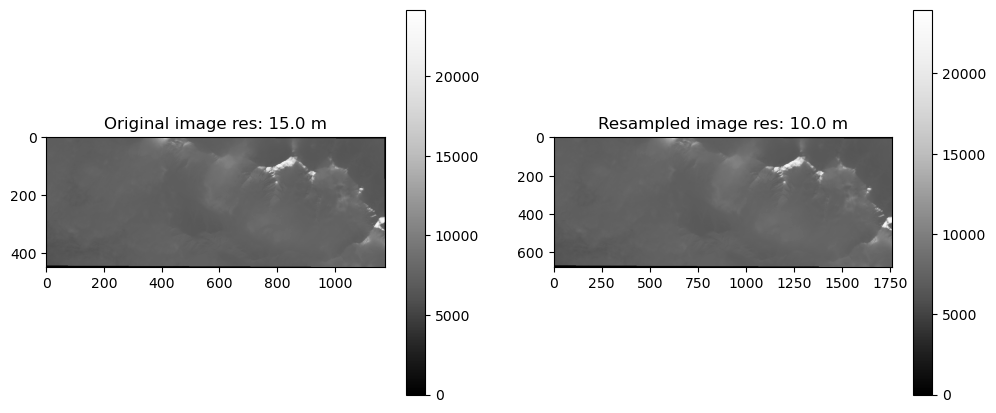

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20171230_20200902_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


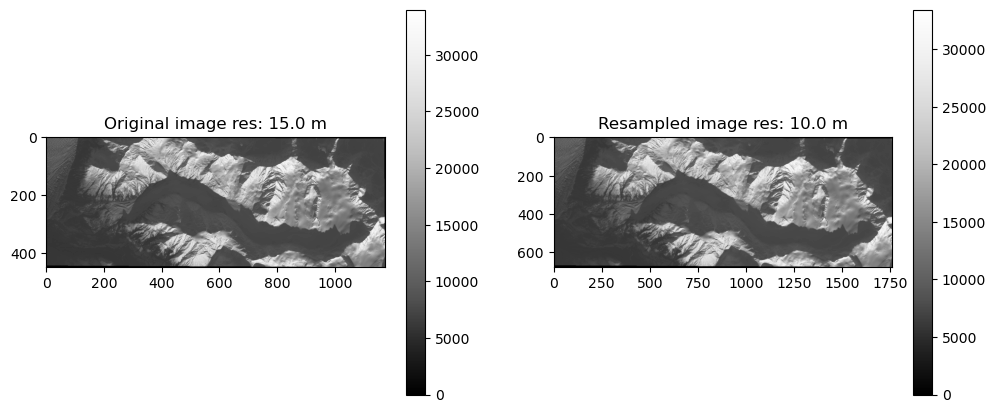

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20181115_20200830_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


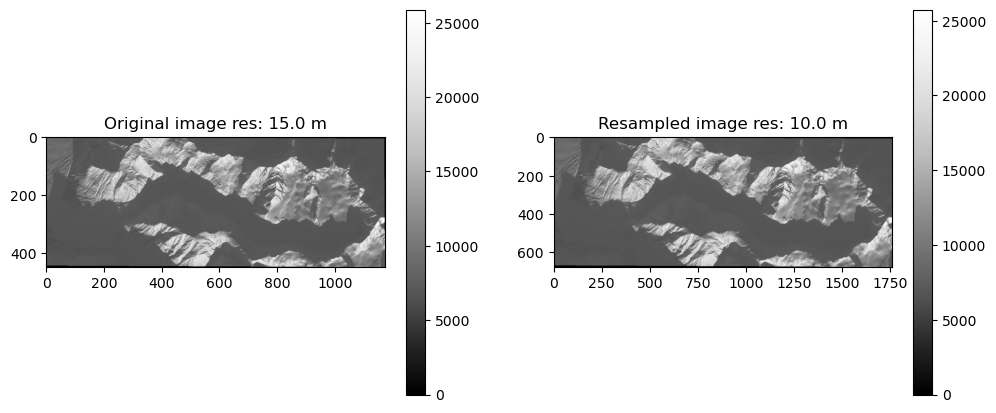

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20170103_20200905_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


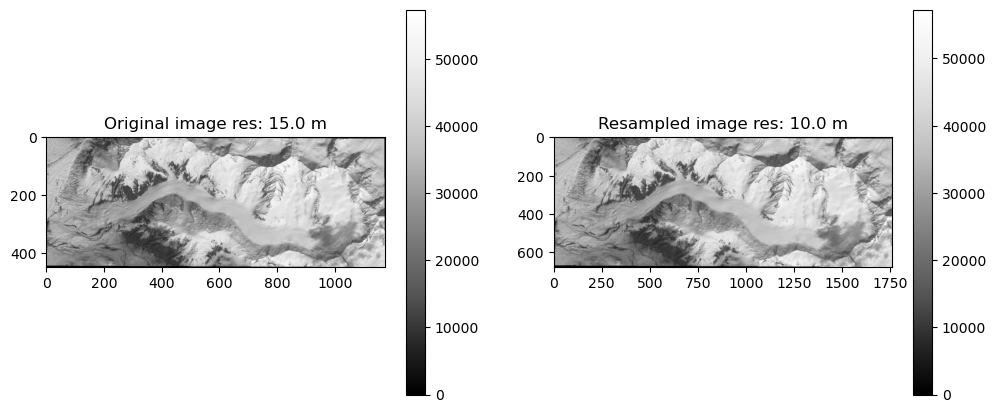

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20220525_20220602_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


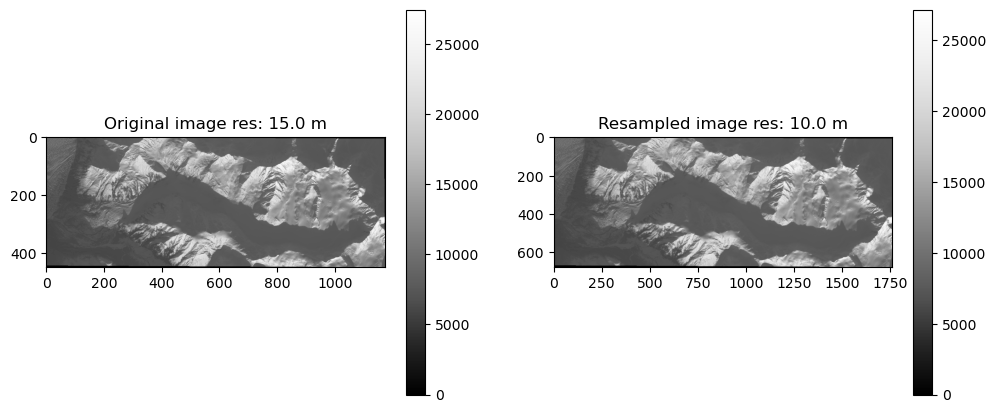

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20141120_20200910_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


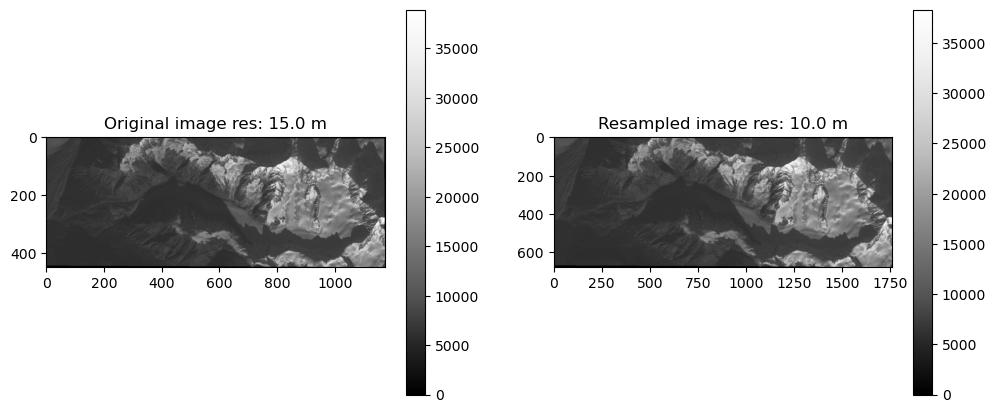

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20161031_20201015_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


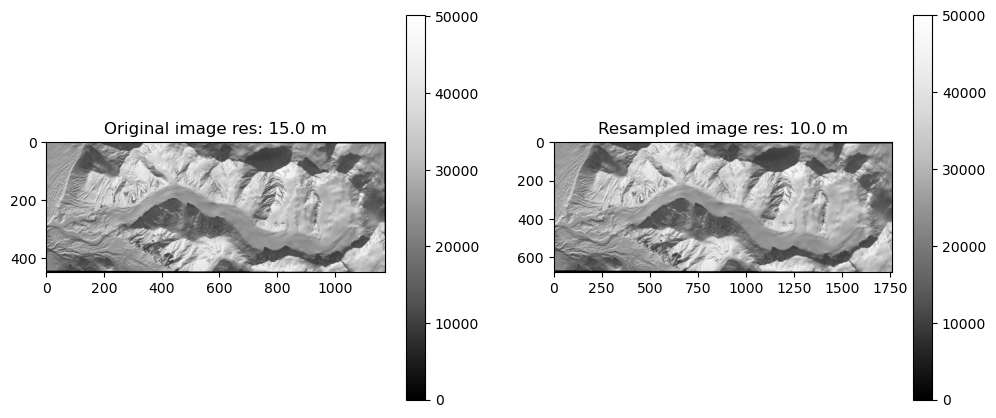

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20170324_20200904_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


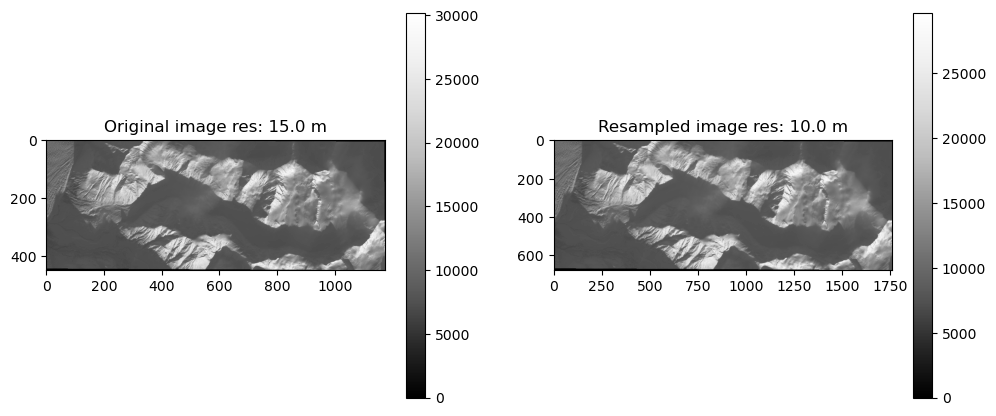

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20160117_20200907_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


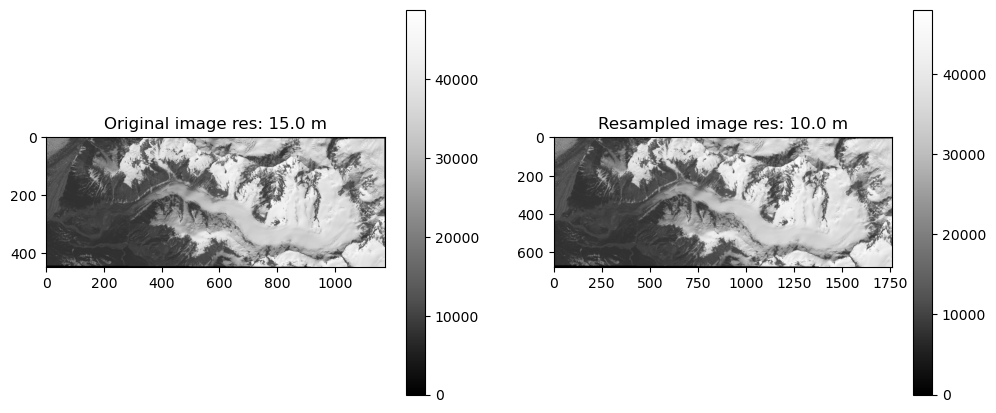

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20220626_20220706_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


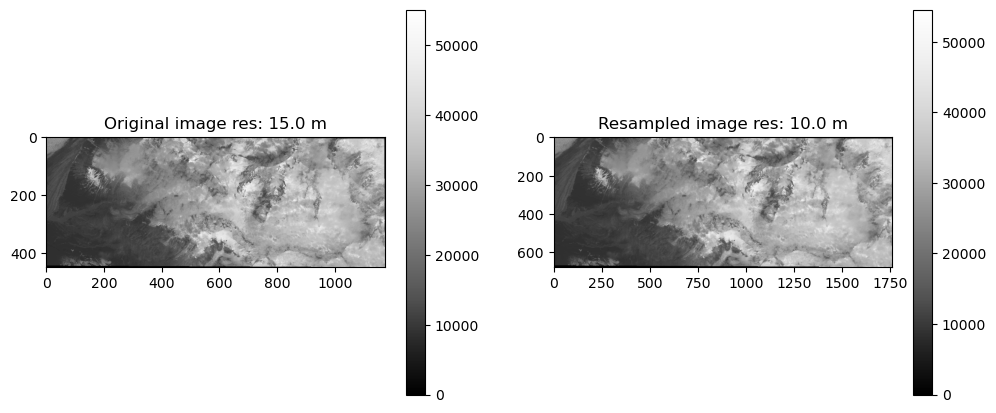

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20150531_20200909_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


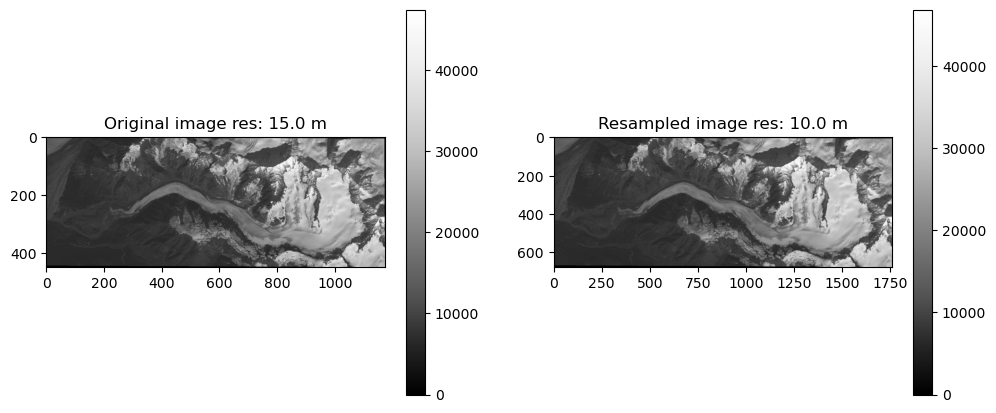

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20180903_20200831_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


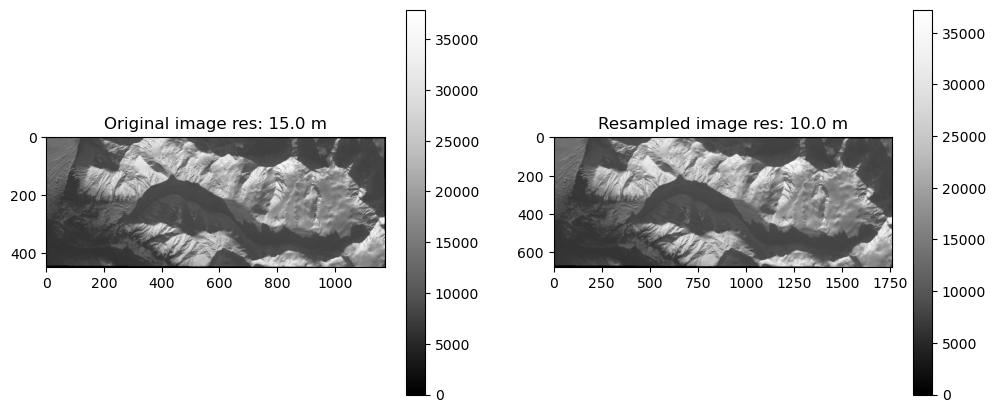

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_061018_20211104_20230507_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


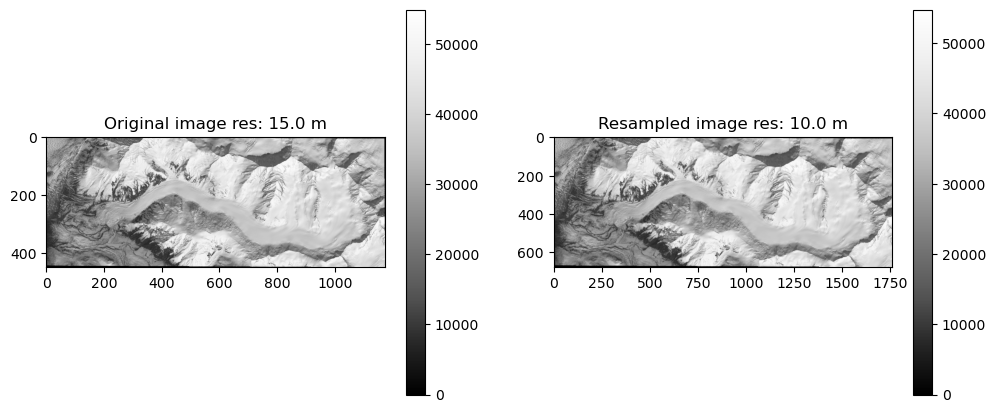

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20160508_20200907_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


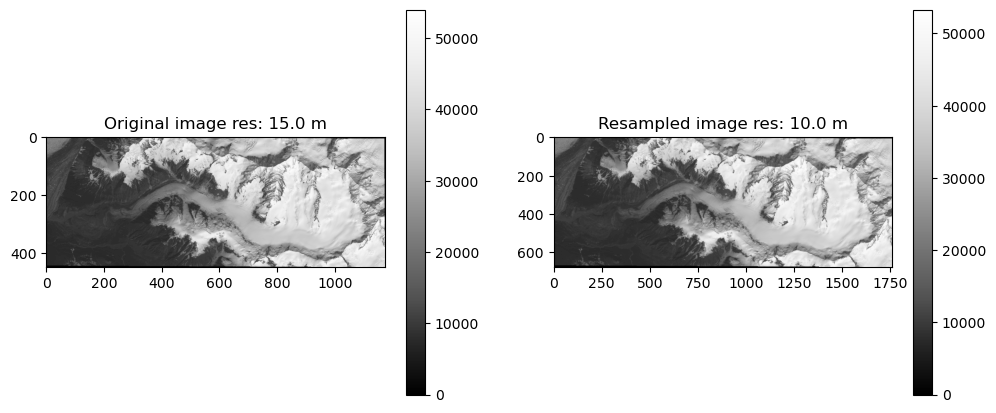

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20140604_20200911_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


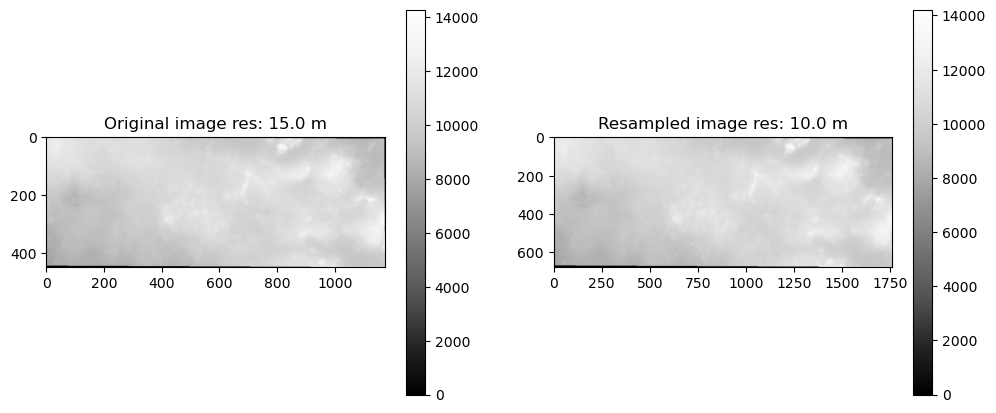

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20151114_20200908_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


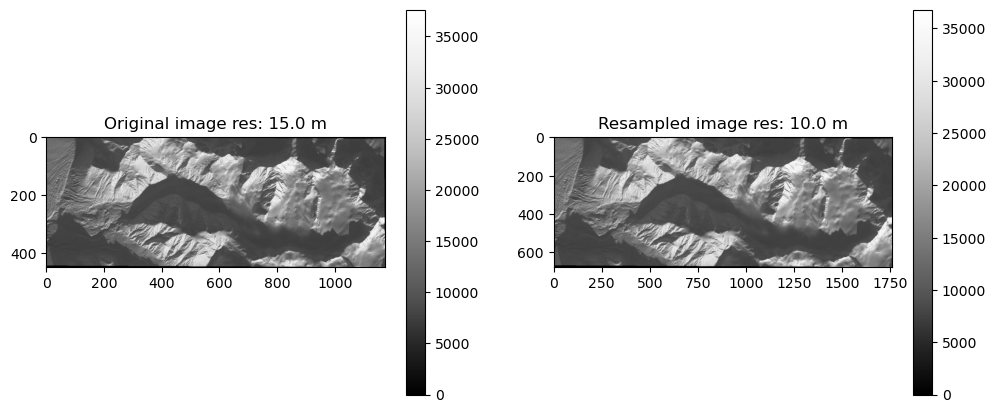

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20220202_20220211_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


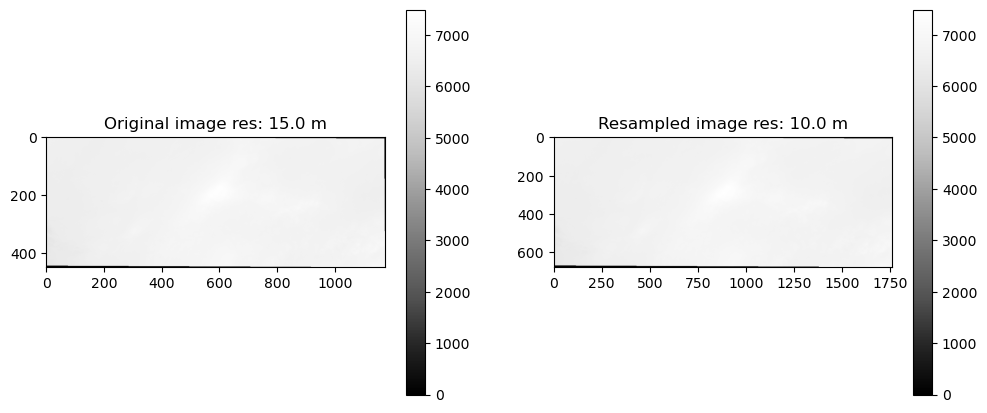

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20160110_20200907_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


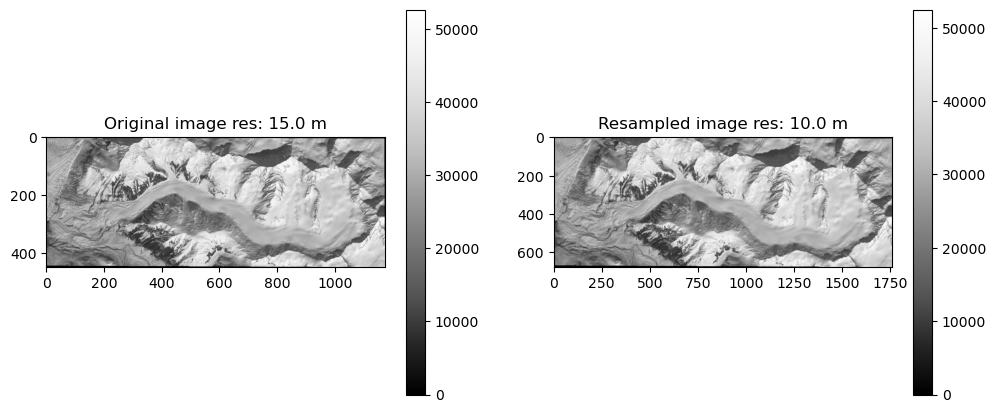

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20190415_20200829_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


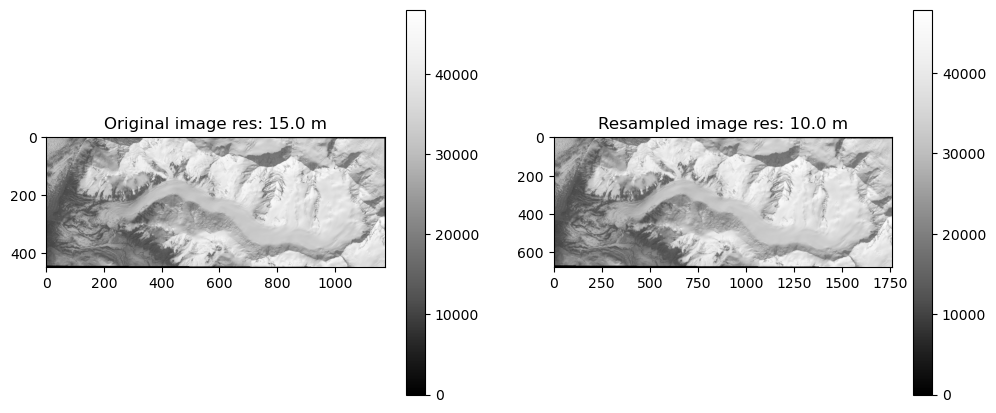

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20150506_20200909_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


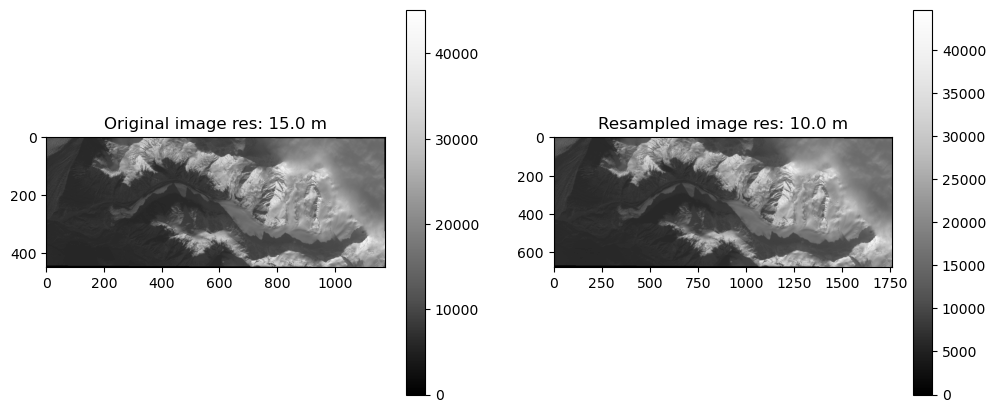

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20141019_20200910_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


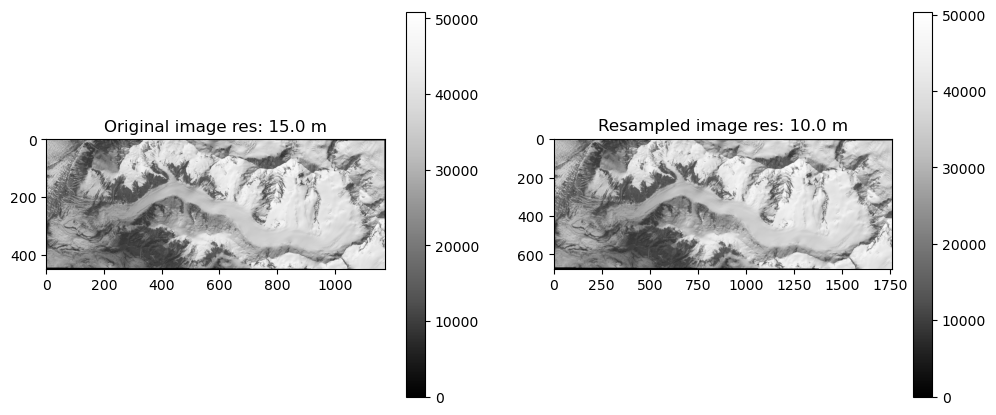

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_062018_20220602_20230414_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


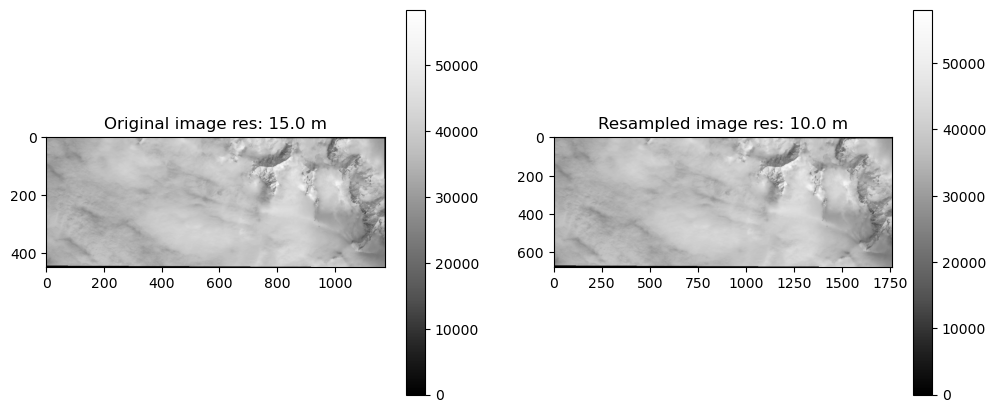

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20180615_20200831_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


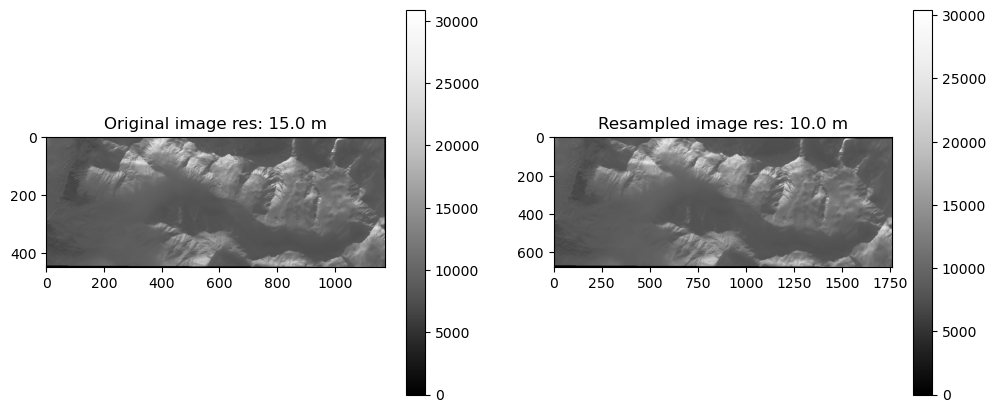

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20180207_20200902_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


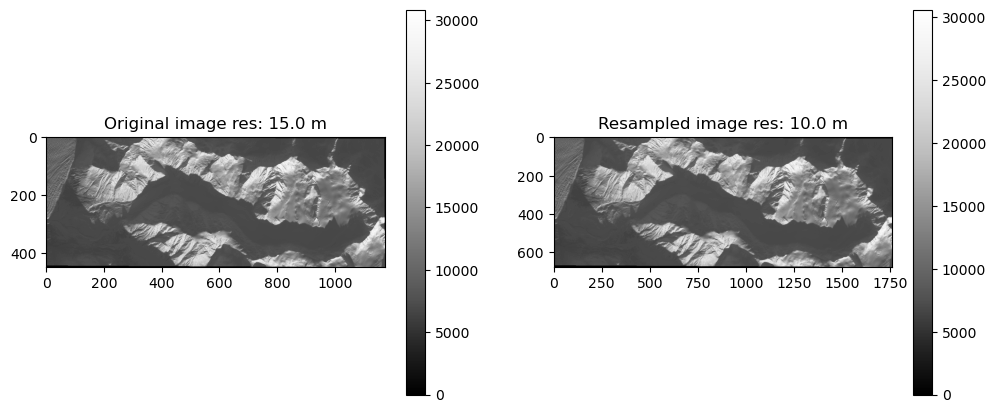

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20151130_20200908_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


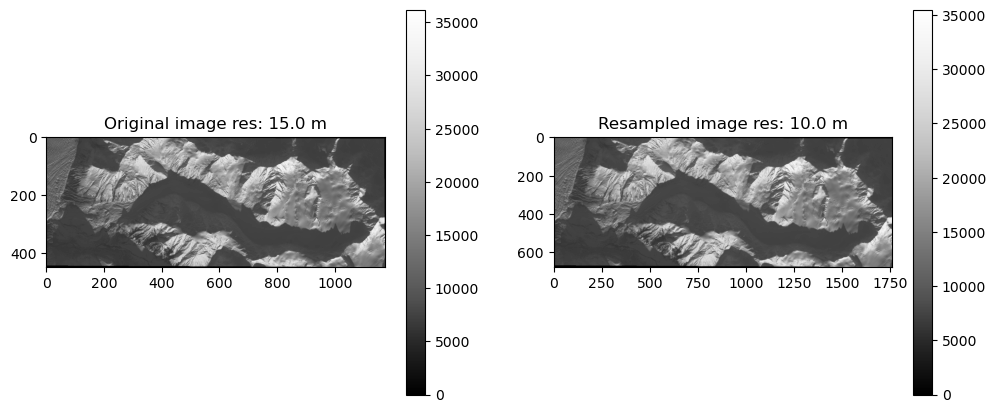

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20221117_20221128_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


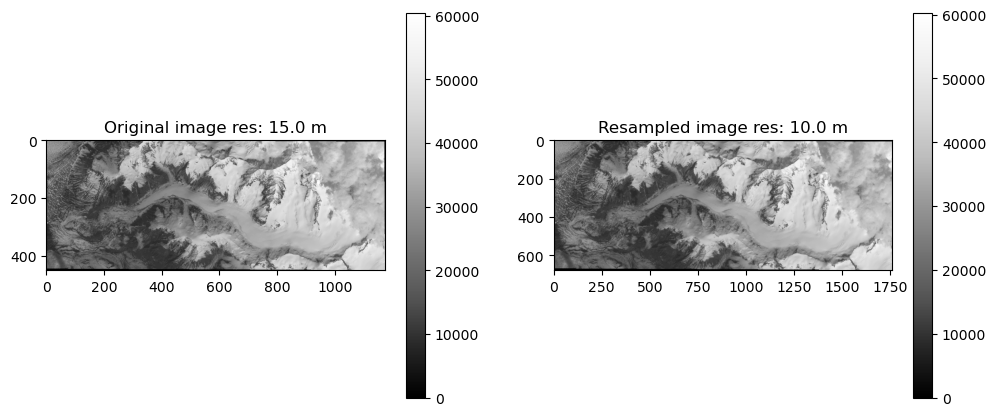

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20200528_20200820_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


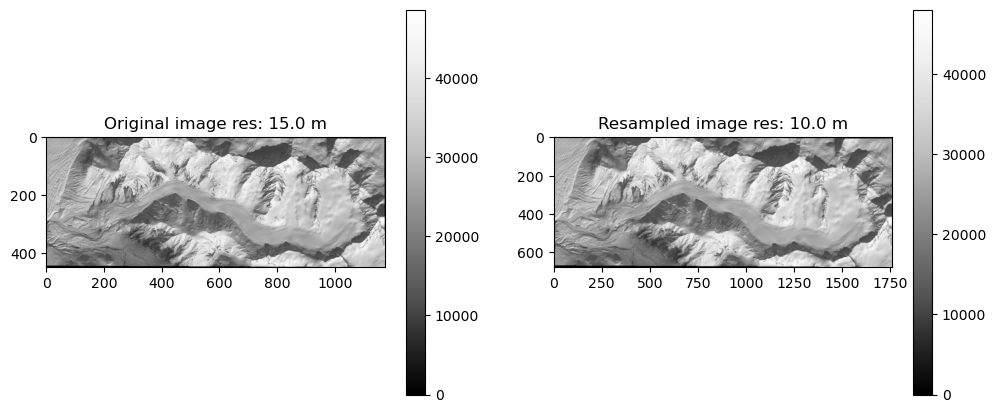

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20200401_20200822_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


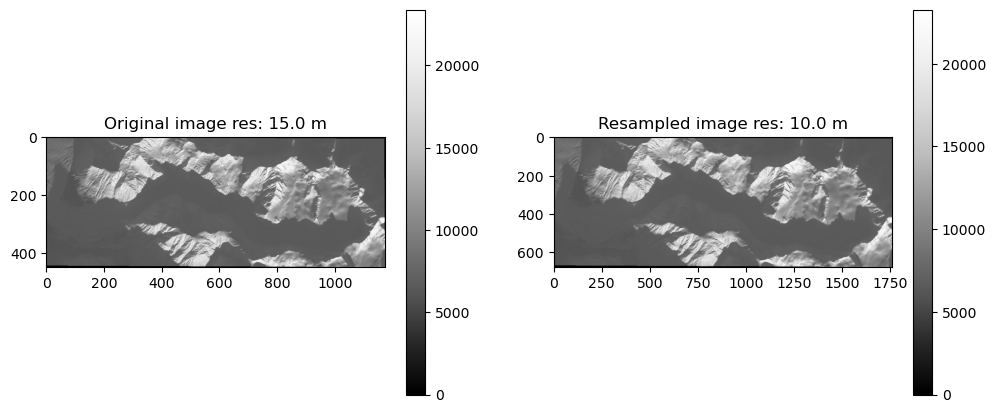

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20171221_20200902_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


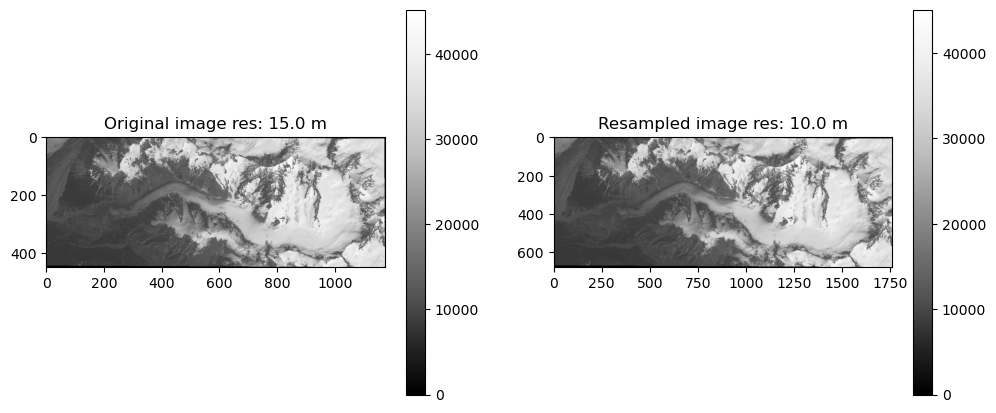

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20150623_20200909_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


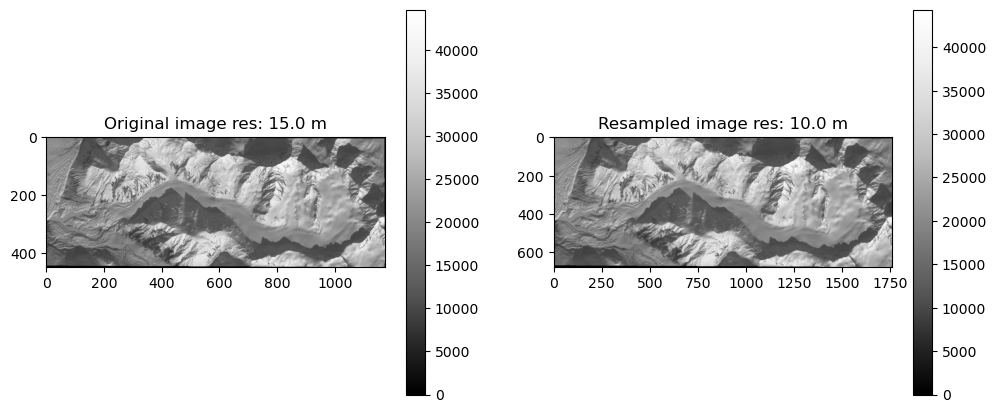

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20190307_20200829_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


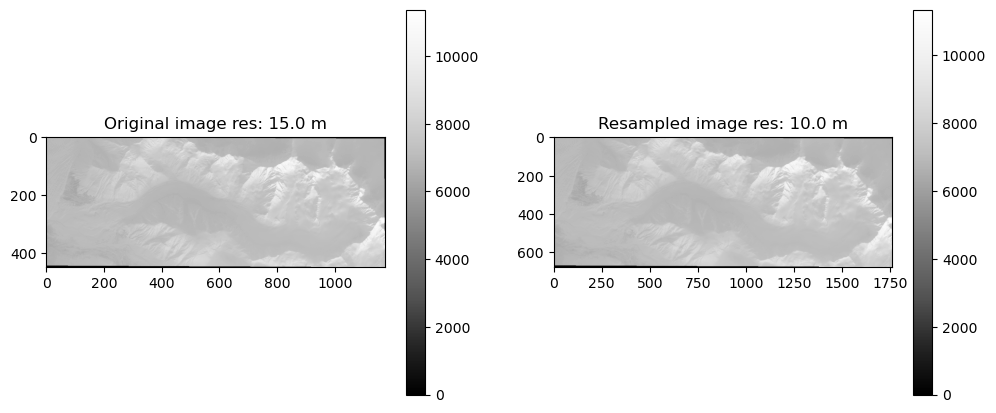

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20151216_20200908_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


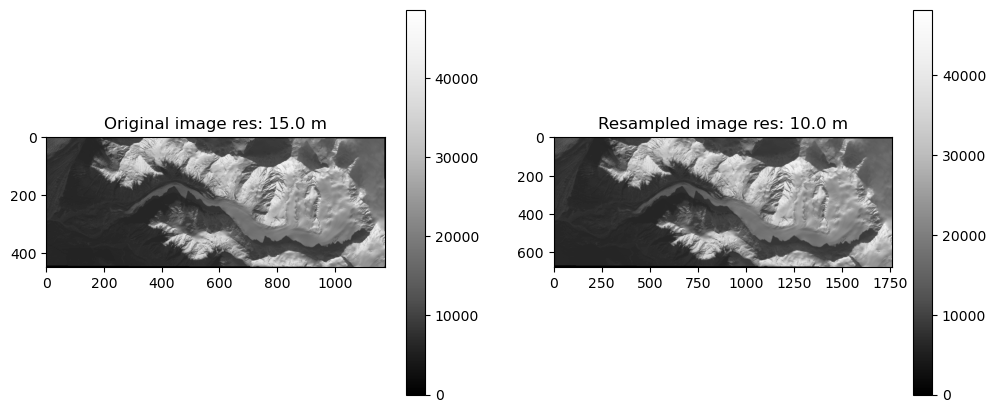

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20201010_20201016_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


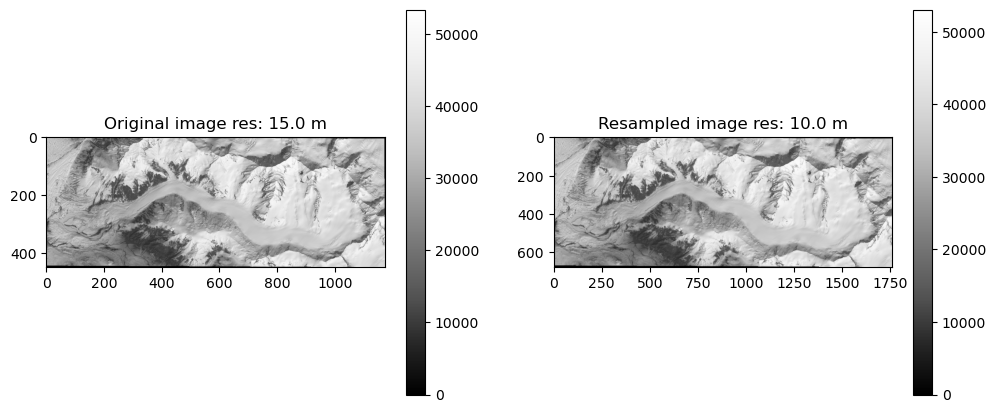

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_061018_20220526_20230415_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


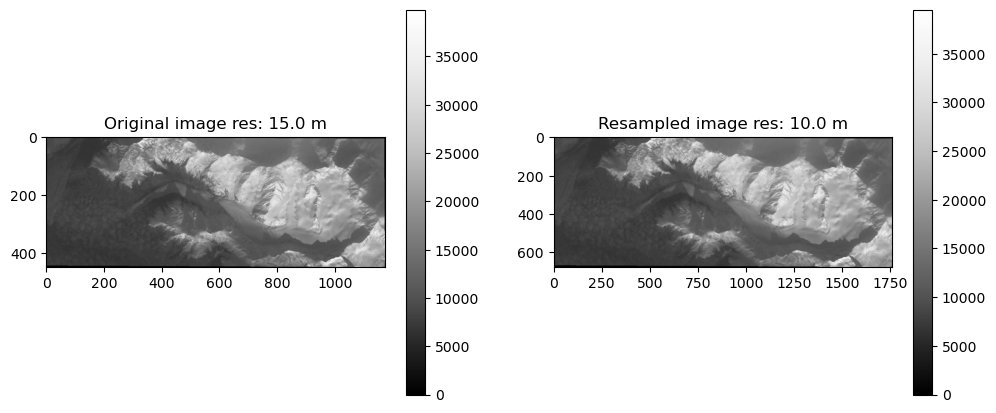

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20201019_20201105_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


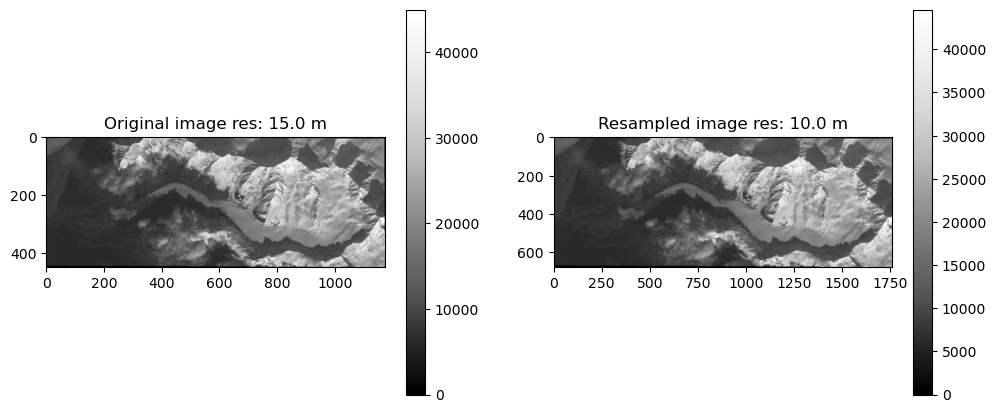

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20131007_20200913_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


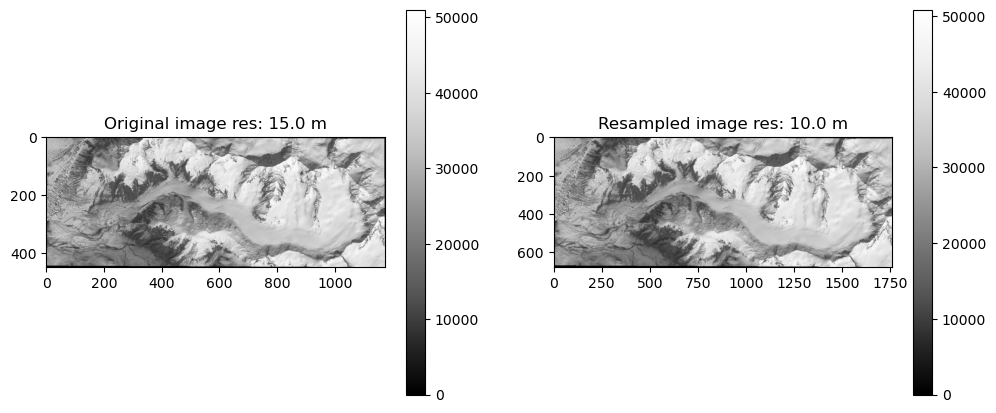

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20200512_20200820_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


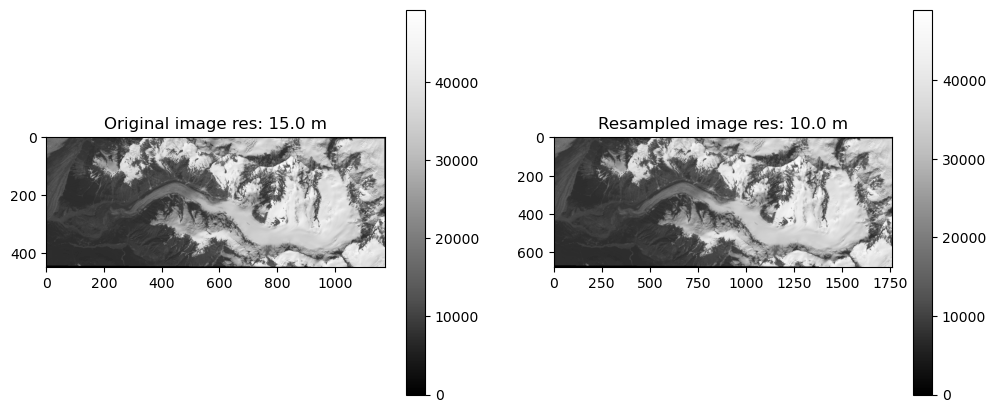

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20160711_20200906_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


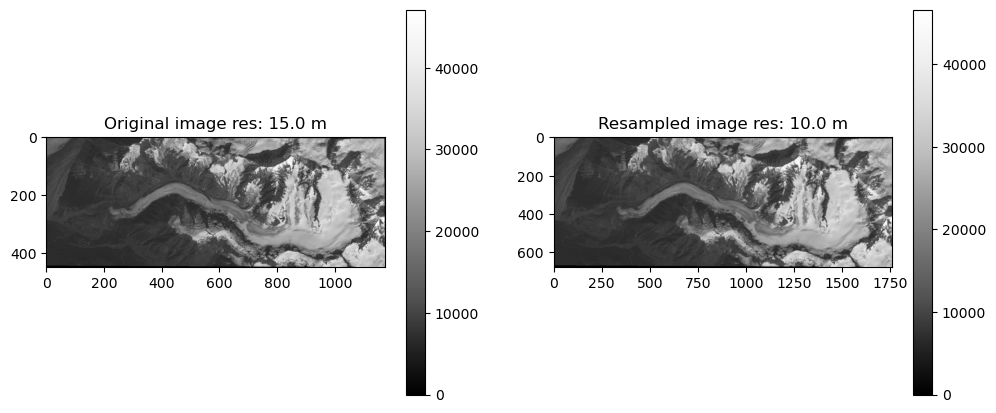

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20140823_20200911_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


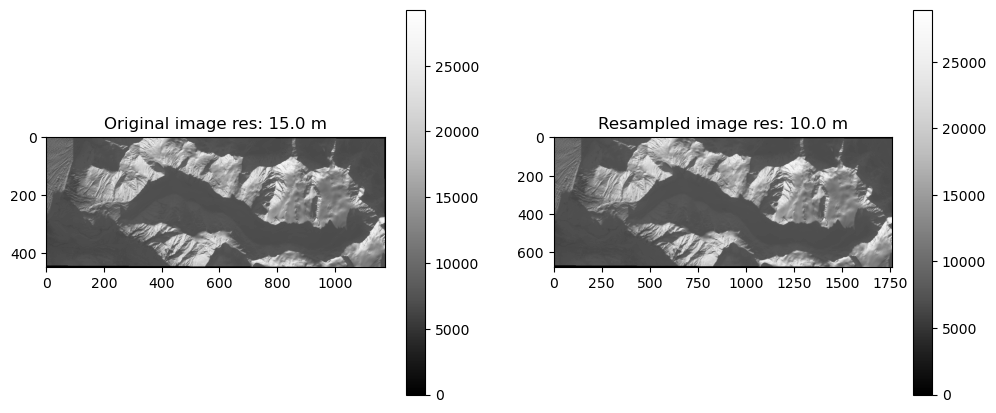

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20190118_20200830_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


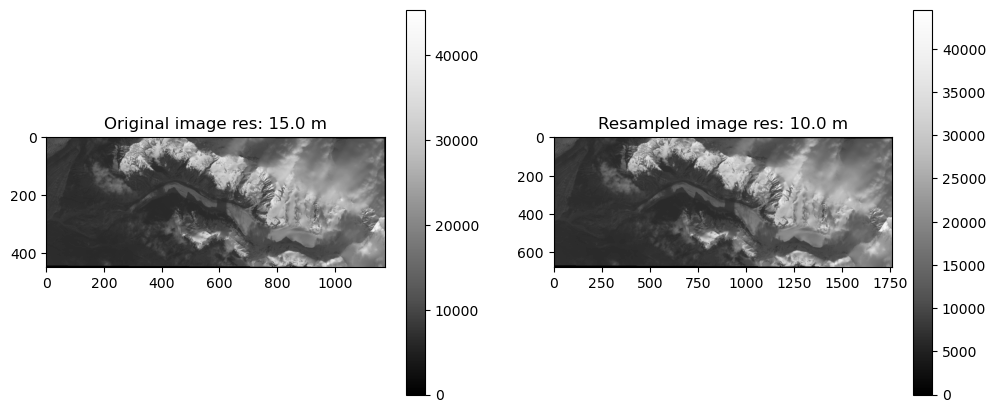

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_062018_20221008_20230326_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


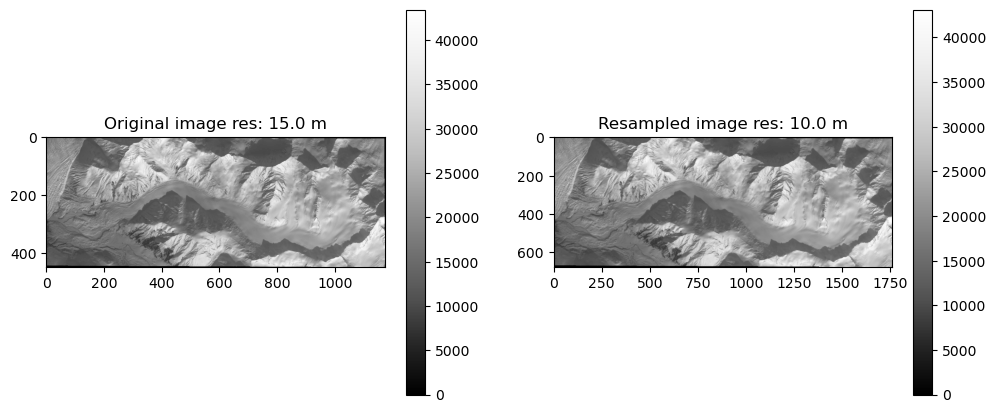

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20160314_20200907_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


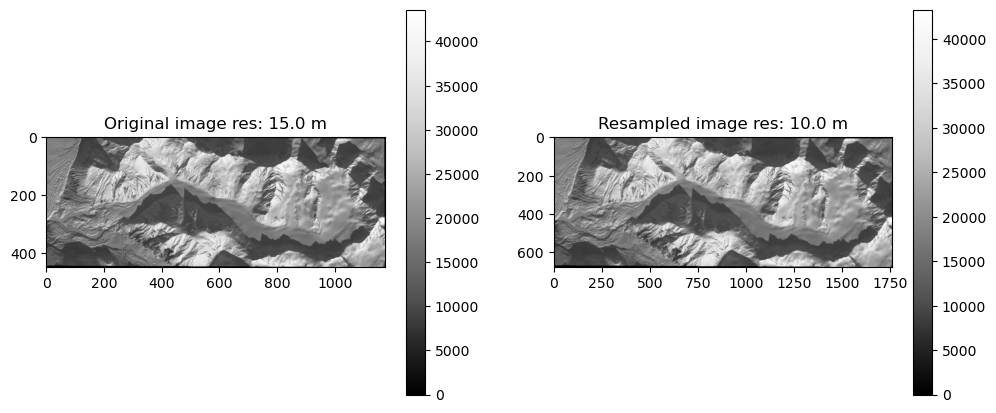

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20190226_20200829_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


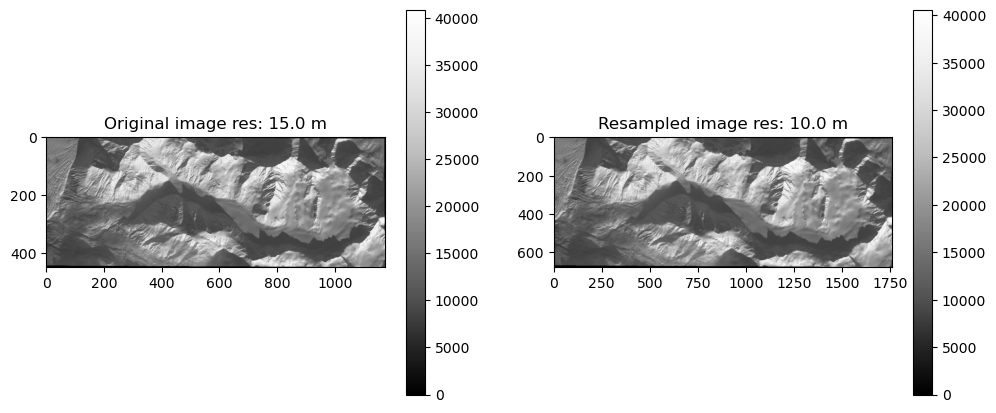

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20190219_20200829_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


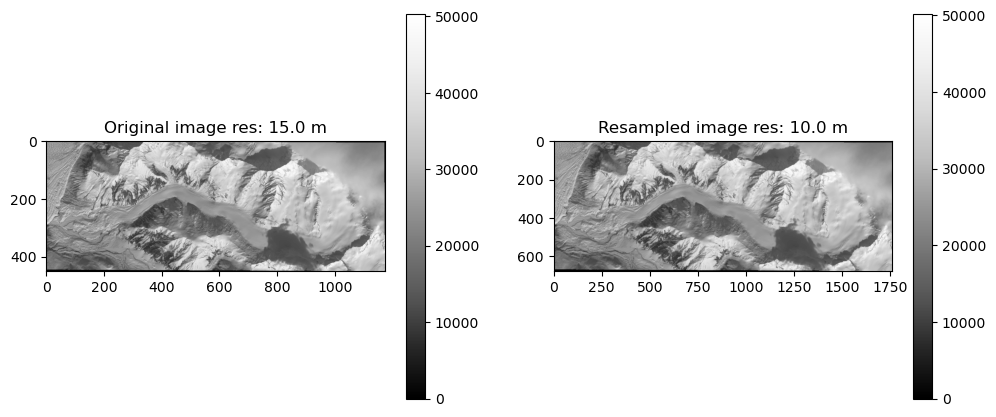

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20190330_20200829_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


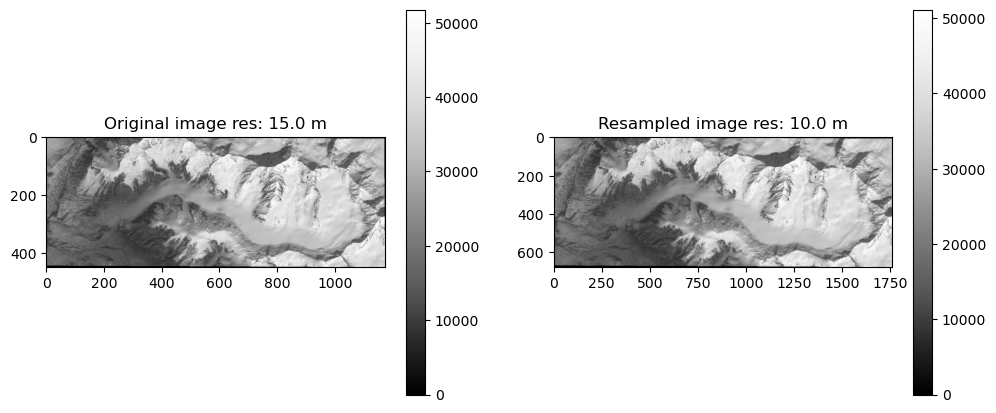

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20140503_20200911_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


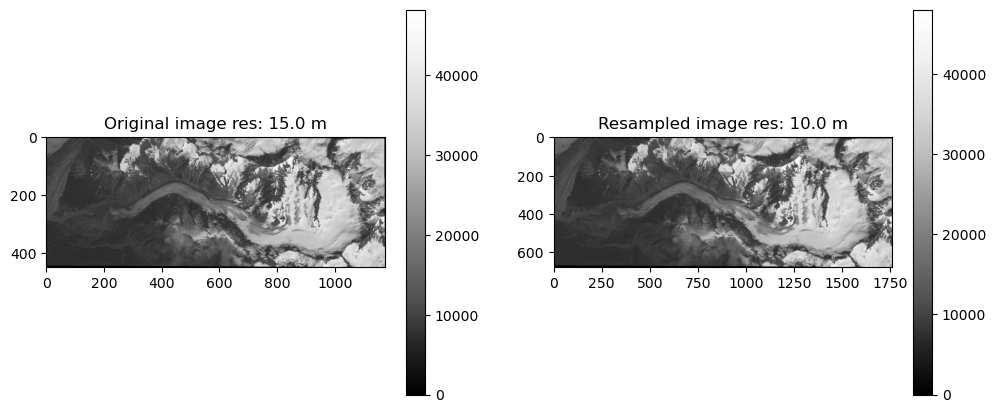

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20150725_20200908_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


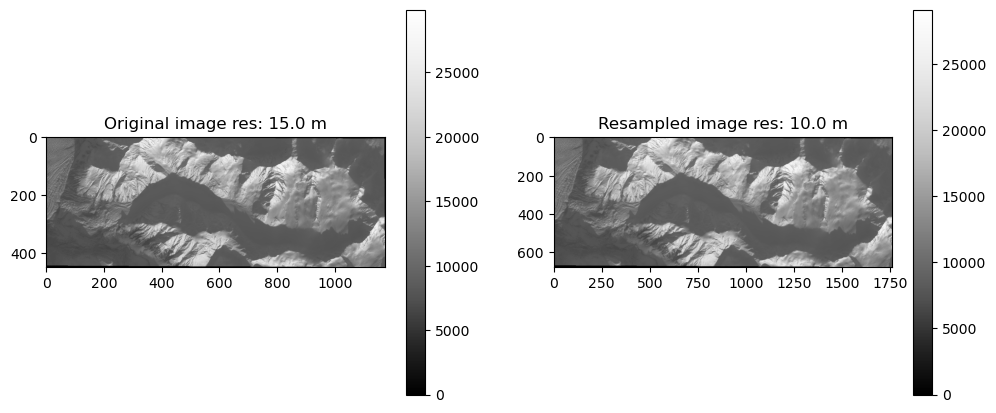

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20180131_20200902_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


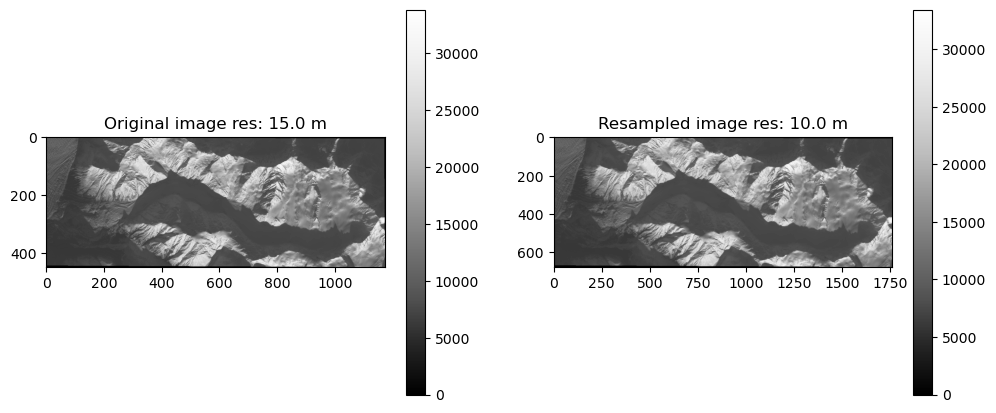

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20161116_20200905_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


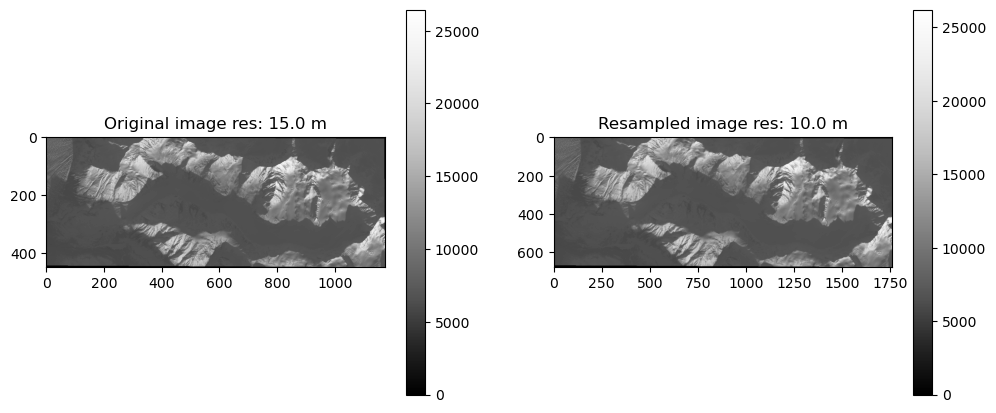

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20150107_20200910_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


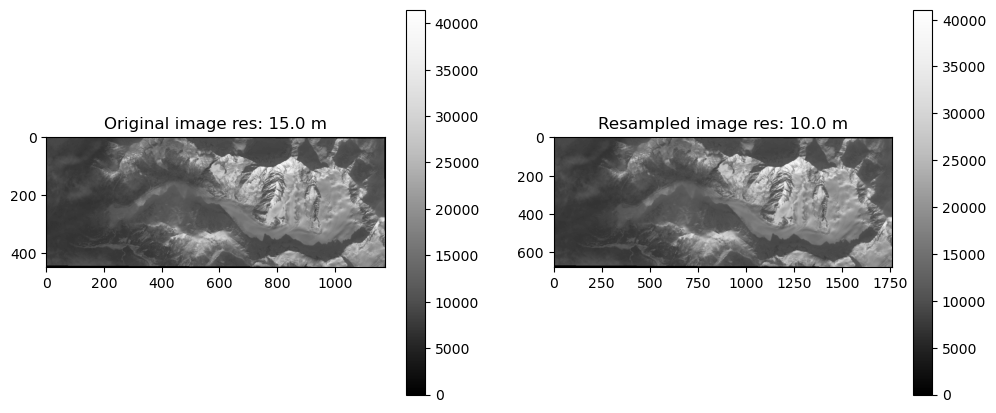

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20161015_20200905_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


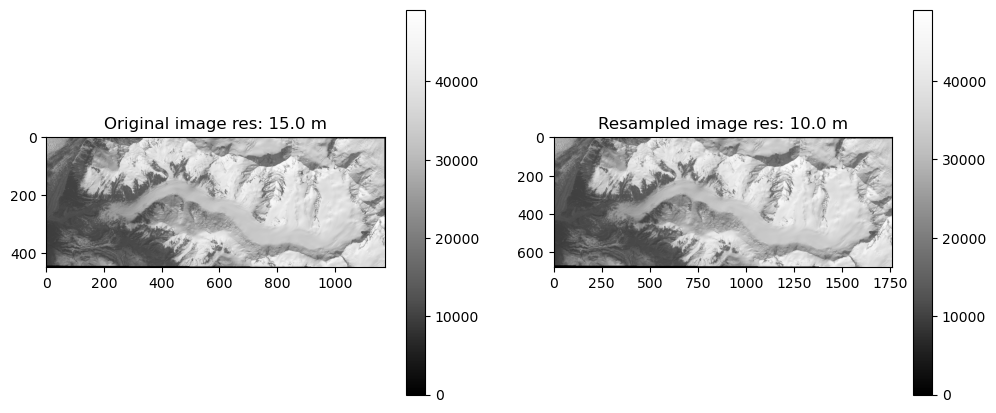

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20150515_20200909_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


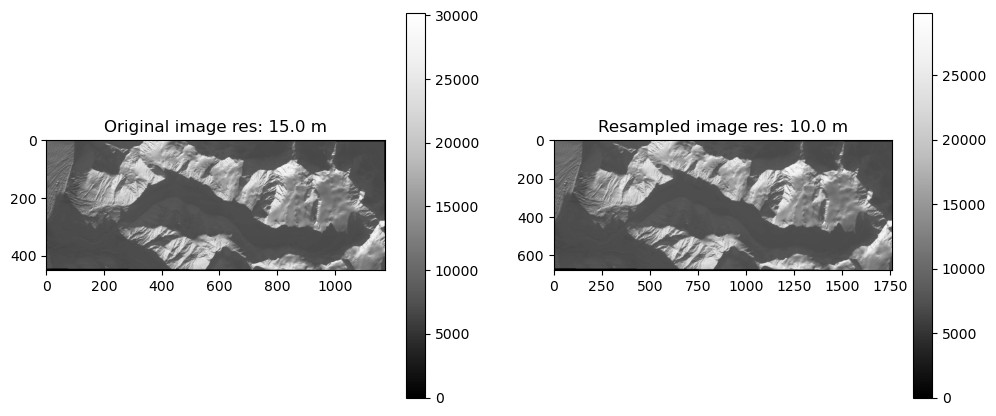

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20220117_20220122_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


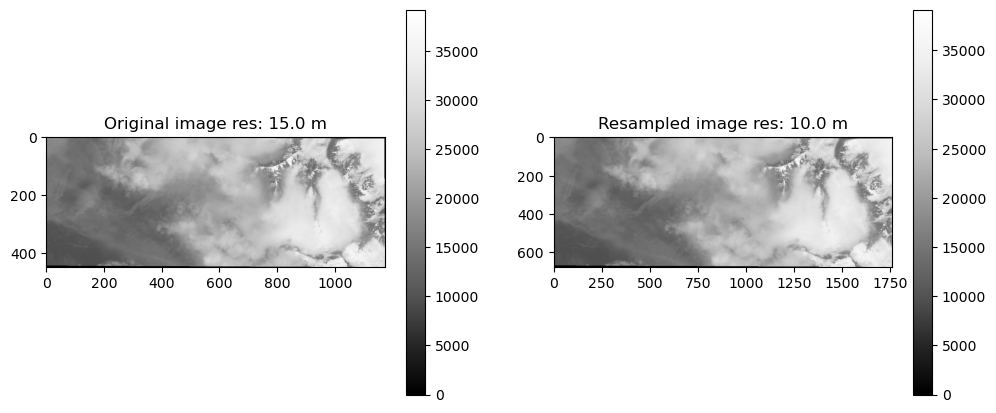

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20190713_20200827_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


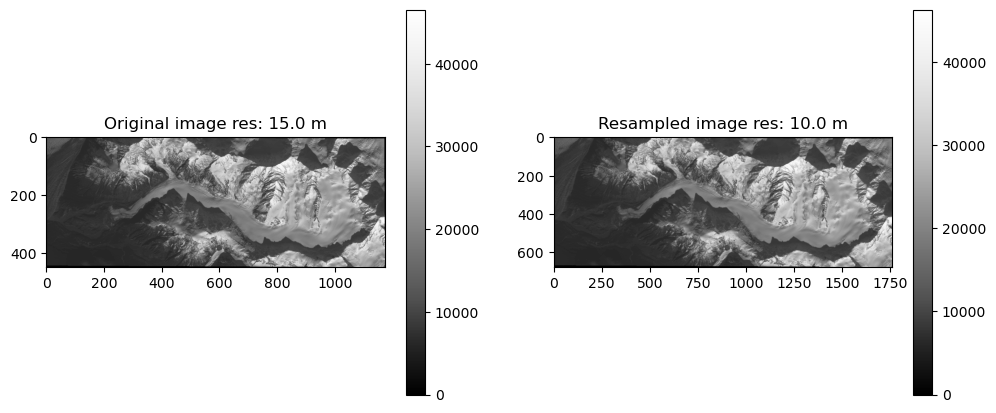

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20151006_20200908_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


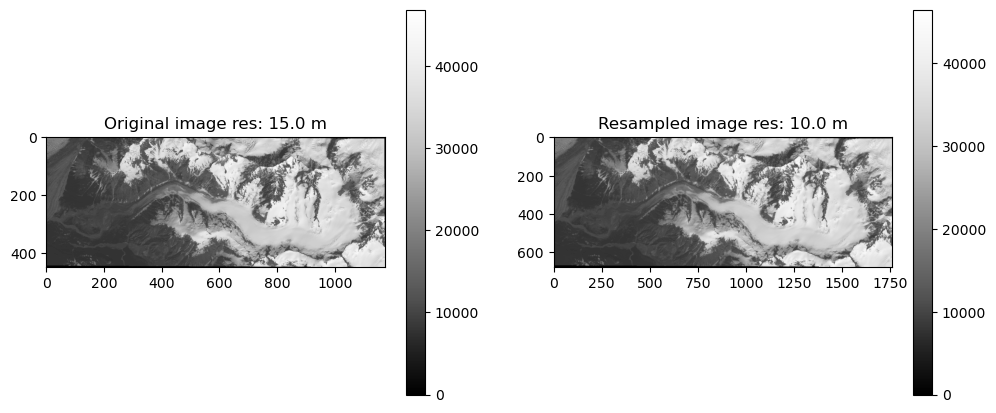

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_062018_20220704_20230408_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


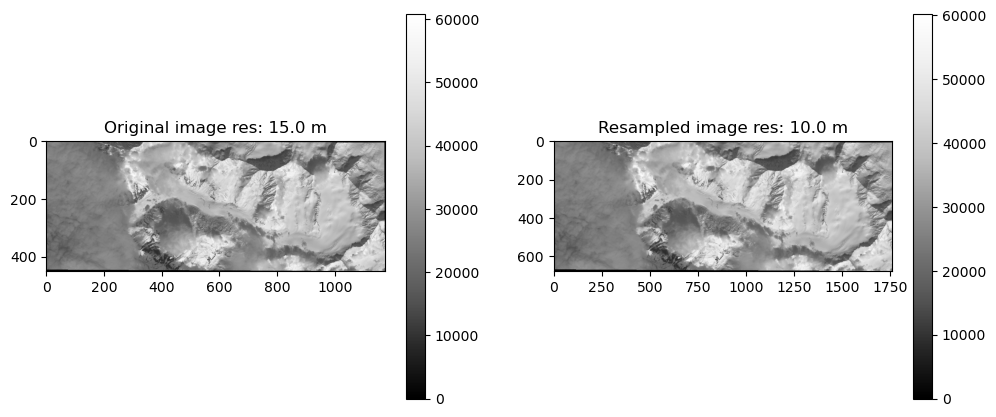

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20180428_20200901_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


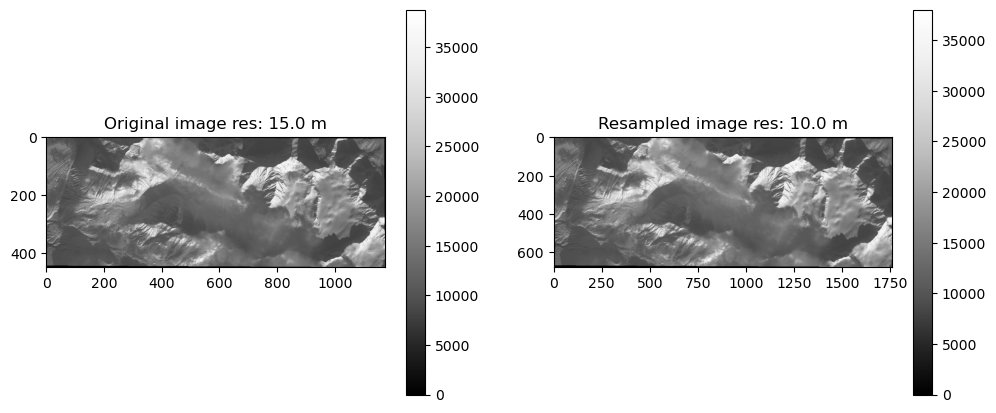

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20200213_20200823_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


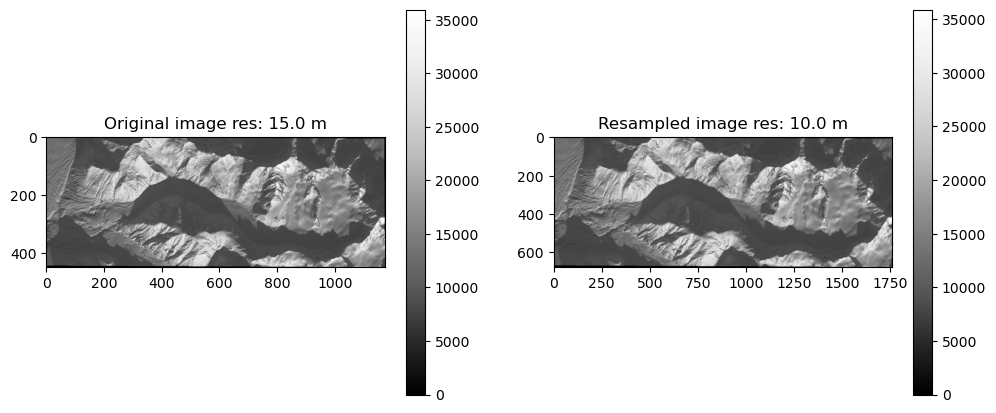

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20170204_20200905_02_T2_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


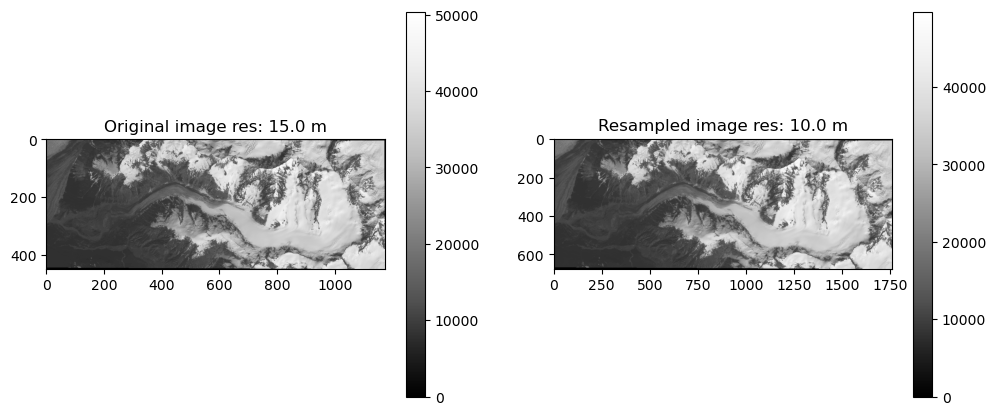

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20190627_20200827_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


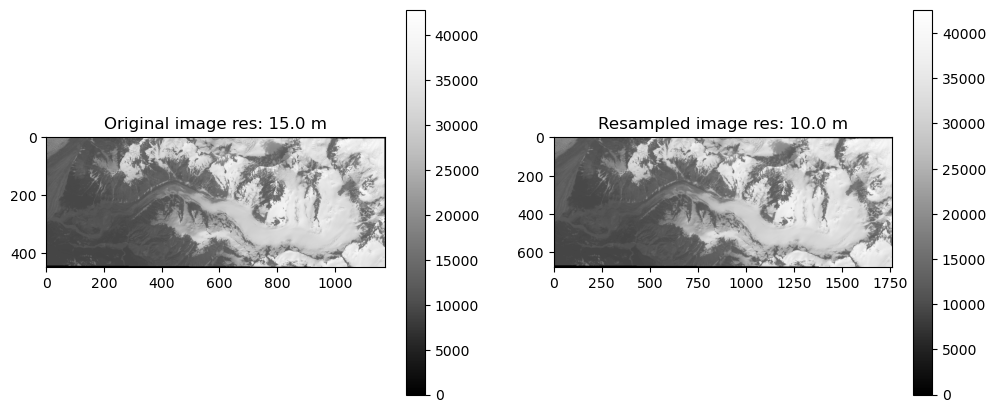

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20220705_20220722_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


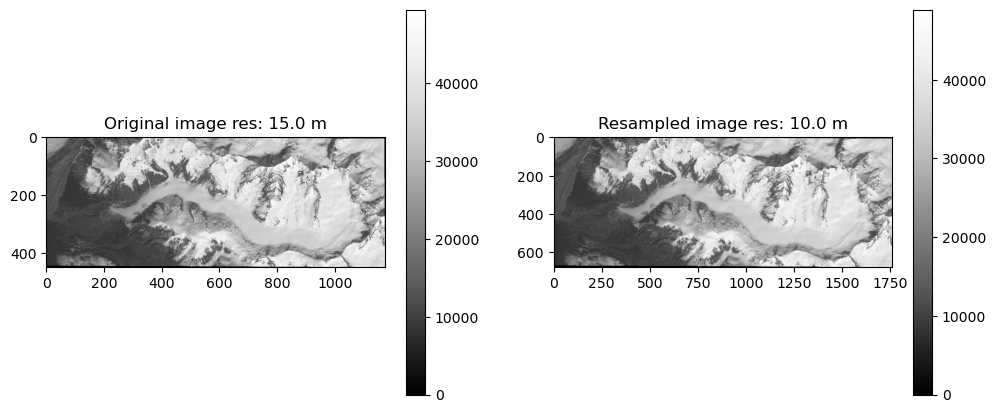

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20150522_20200909_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


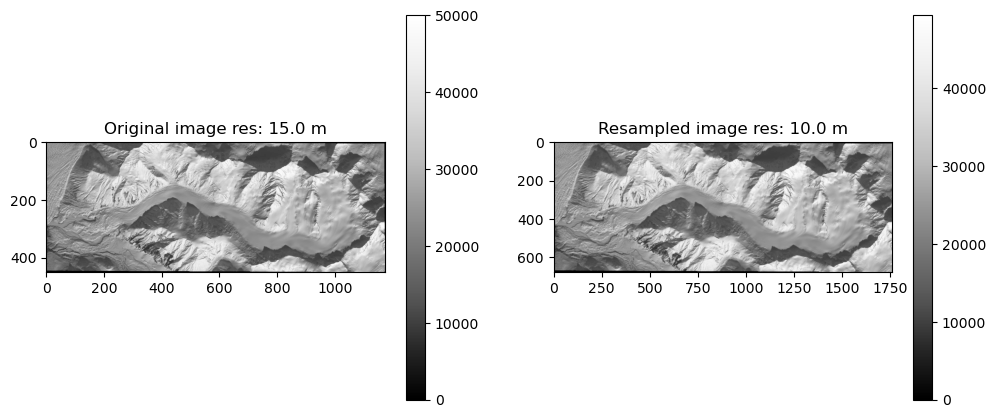

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20160321_20200907_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


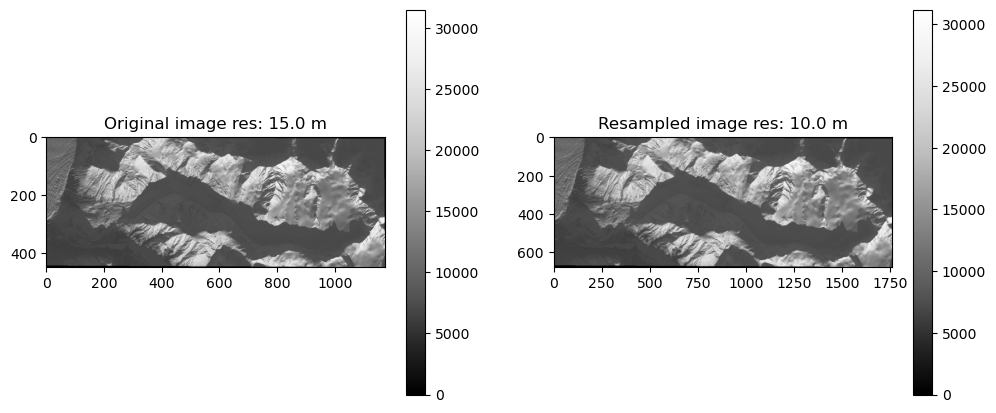

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20201120_20210314_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


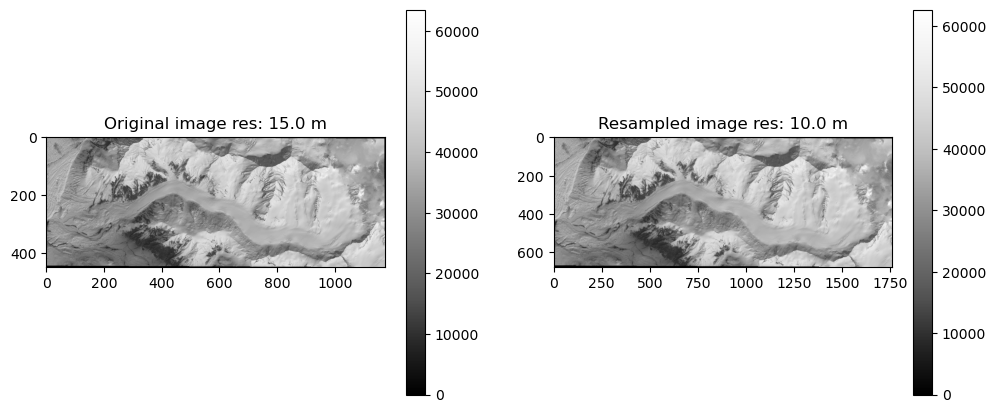

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20220518_20220525_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


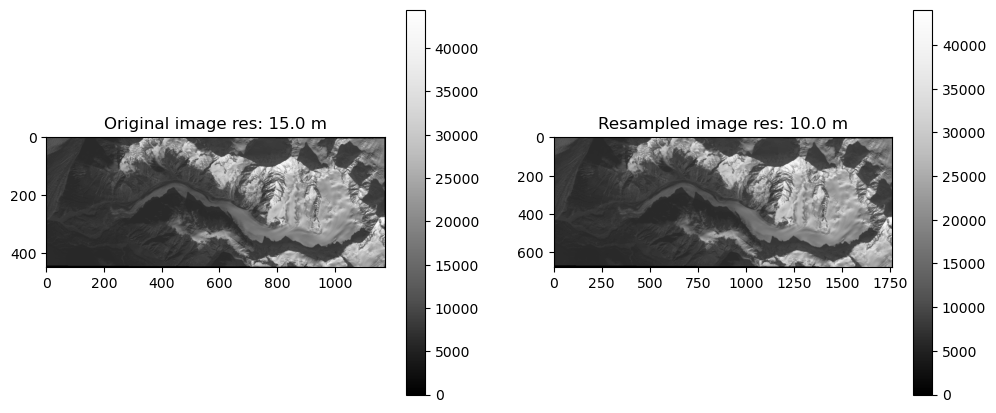

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_061018_20161008_20200906_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


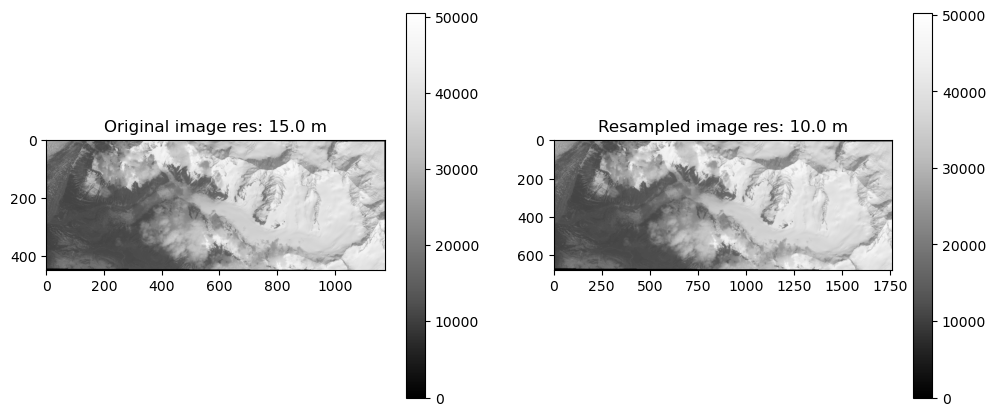

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20170527_20200903_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


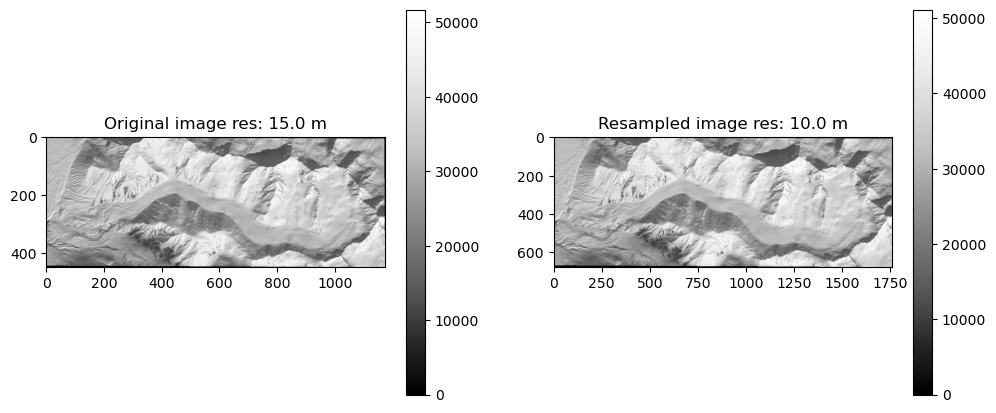

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC09_L1TP_062018_20220415_20230422_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


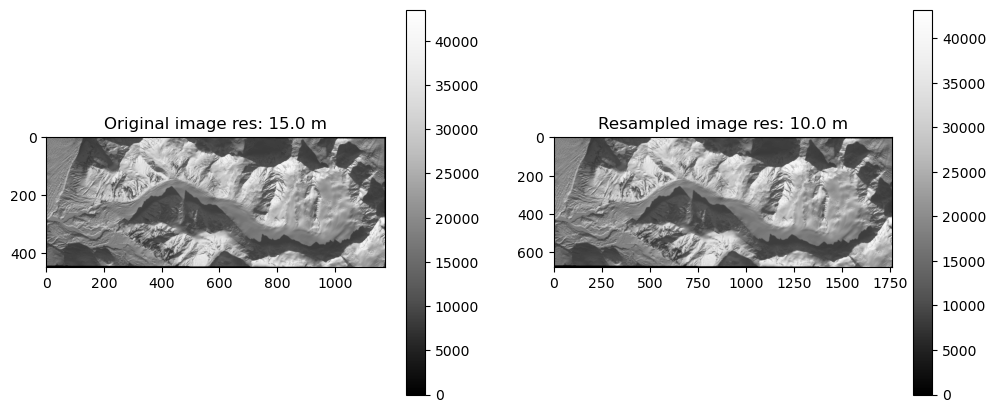

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20140228_20200911_02_T1_B8_BufferVariegated_clipped_10m.tif
(450, 1173)
Resampled to new dimensions: (676, 1760)


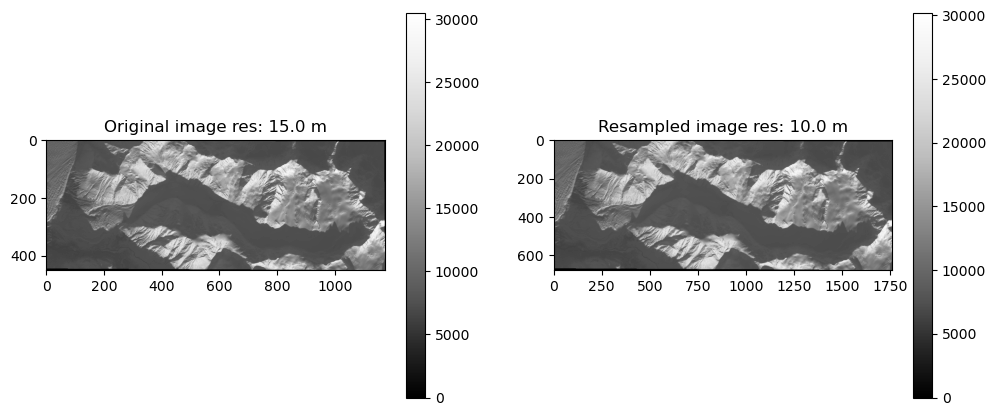

Save resampled DEM to /Volumes/JUKES_EXT/CautoRIFT_sites/VG/Variegated_LS_images/LC08_L1TP_062018_20131124_20200912_02_T1_B8_BufferVariegated_clipped_10m.tif


In [76]:
# RESAMPLE ALL TO THE MINIMUM RESOLUTION (upsampling)
for folder in folderpath_list:
    # all images in each folder have the same resolution:
    files = glob.glob(folder+'*.tif')
    files.extend(glob.glob(folder+'*.TIF'))
    
    for file in files:
        if not file.endswith('m.tif'):
            img_r = rio.open(file) # open the file
    
            # if image res not equals the minimum res, resample it
            if img_r.transform[0] != MIN_RES:
                img = img_r.read(1)
                img_x = np.arange(img_r.bounds.left, img_r.bounds.right-1, img_r.transform[0])
                img_y = np.arange(img_r.bounds.top, img_r.bounds.bottom, -img_r.transform[0])
                
                 # Create thew new x and y grid values using DEM bounds and the chipsize
                img_resamp = np.zeros((len(new_y), len(new_x))) # create an empty resampled img
                print(img_r.shape)
                
                # Resample to your new DEM bounds
                img[np.isnan(img)] = 0 # remove nans before interpolation
                f = interp2d(img_x, img_y, img) # create interpolation object
                img_resamp = f(new_x,new_y) # resample the NIR data to the DSM coordinates
                img_resamp = np.flipud(img_resamp) # flip up down
                print("Resampled to new dimensions:",img_resamp.shape)
                
                # Display the two DEMs as a visual check
                fig, (ax1,ax2) = plt.subplots(1,2, figsize=(12,5))
                im1 = ax1.imshow(img, cmap='Greys_r', vmin=0)
                ax1.set_title('Original image res: '+str(img_r.transform[0])+' m') # original spatial resolution
                fig.colorbar(im1, ax=ax1)
                
                im2 = ax2.imshow(img_resamp, cmap='Greys_r', vmin=0)
                ax2.set_title('Resampled image res: '+str(MIN_RES)+' m') # new spatial resolution
                fig.colorbar(im2, ax=ax2)
                plt.show()
                
                # Save the resampled DEM to georeferenced tif file
                print("Save resampled DEM to", file[:-4]+'_'+str(int(MIN_RES))+'m.tif')
                rio_write(file[:-4]+'_'+str(int(MIN_RES))+'m.tif', img_resamp, img_r.crs, MIN_BOUNDS, MIN_RES)
    
            # for those that equal the minimum res, just rename it with MIN_RES+'m' as suffix
            else:
                os.rename(file,file[:-4]+'_'+str(int(MIN_RES))+'m.tif')